In [1]:
import torch
import numpy as np
from sklearn import metrics
from sklearn.isotonic import IsotonicRegression

import matplotlib.pyplot as plt

# Local imports
import carl_utils.preprocessing as carl_ppro
import carl_utils.models as carl_models
import carl_utils.eval as carl_eval
import carl_utils.plotting as carl_plot

import logging
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#DEVICE = 'cpu'
print(DEVICE)

cuda:0


# Evaluate the effectiveness of this model on test data

## Prepare the test data

In [3]:
n_val_events = int(1e5) // 2
n_test_events = int(1e5)

batch_size = 1024

calibration_nominal_dataset = carl_ppro.DeepSetsDataset(["/data/mdrnevich/AGC/CMS_ttbar_nominal_DeepSets_validation_data_new2.root",], features, 0, start_event=n_val_events, stop_event=2*n_val_events)
test_nominal_dataset = carl_ppro.DeepSetsDataset(["/data/mdrnevich/AGC/CMS_ttbar_nominal_DeepSets_testing_data_new2.root",], features, 0, stop_event=n_test_events)

calibration_PS_var_dataset = carl_ppro.DeepSetsDataset(["/data/mdrnevich/AGC/CMS_ttbar_PS_var_DeepSets_validation_data_new2.root",], features, 1, start_event=n_val_events, stop_event=2*n_val_events)
test_PS_var_dataset = carl_ppro.DeepSetsDataset(["/data/mdrnevich/AGC/CMS_ttbar_PS_var_DeepSets_testing_data_new2.root",], features, 1, stop_event=n_test_events)

calibration_generator_data = carl_ppro.CombinedDataset(calibration_nominal_dataset, calibration_PS_var_dataset)
test_generator_data = carl_ppro.CombinedDataset(test_nominal_dataset, test_PS_var_dataset)

100%|██████████| 100000/100000 [00:48<00:00, 2066.72it/s]


In [4]:
calibration_loader = carl_ppro.get_training_DataLoader(calibration_generator_data, features, X_scalers, weight_norm=weight_norm, batch_size=batch_size)
test_loader = carl_ppro.get_training_DataLoader(test_generator_data, features, X_scalers, weight_norm=weight_norm, batch_size=batch_size, shuffle=False)
test_nominal_loader = carl_ppro.get_training_DataLoader(carl_ppro.CombinedDataset(test_nominal_dataset), features, X_scalers, weight_norm=weight_norm, batch_size=batch_size, shuffle=False)

## Load the best model

In [41]:
model = carl_models.load_model("deepsets_model.zip").to(DEVICE)
X_scalers, weight_norm = carl_ppro.load_scaling("deepsets_model.zip")
features = model.features

print(model), print(model.features);

DeepSetsEnsemble(
  (phi0):  Sequential(
    (0): Conv1d(4, 512, kernel_size=(1,), stride=(1,))
    (1): ReLU()
    (2): Conv1d(512, 256, kernel_size=(1,), stride=(1,))
    (3): ReLU()
    (4): Conv1d(256, 128, kernel_size=(1,), stride=(1,))
    (5): ReLU()
  )
  (phi1):  Sequential(
    (0): Conv1d(5, 512, kernel_size=(1,), stride=(1,))
    (1): ReLU()
    (2): Conv1d(512, 256, kernel_size=(1,), stride=(1,))
    (3): ReLU()
    (4): Conv1d(256, 128, kernel_size=(1,), stride=(1,))
    (5): ReLU()
  )
  (phi2):  Sequential(
    (0): Conv1d(5, 512, kernel_size=(1,), stride=(1,))
    (1): ReLU()
    (2): Conv1d(512, 256, kernel_size=(1,), stride=(1,))
    (3): ReLU()
    (4): Conv1d(256, 128, kernel_size=(1,), stride=(1,))
    (5): ReLU()
  )
  (mlp):  Sequential(
    (0): Linear(in_features=385, out_features=1024, bias=True)
    (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Linear(in_features=1024, out_features=1024, bias=

## Get the scores (model output) on the test data

In [42]:
test_scores, test_targets, test_weights = carl_eval.get_scores(
    model,
    test_loader,
    device=DEVICE,
    leave=True
)

100%|██████████| 196/196 [00:14<00:00, 13.19it/s]


## Evaluate the ROC curve for the model

In [43]:
print("Area under the ROC curve: {:.4}".format(metrics.roc_auc_score(test_targets, test_scores, sample_weight=test_weights)))

Area under the ROC curve: 0.5921


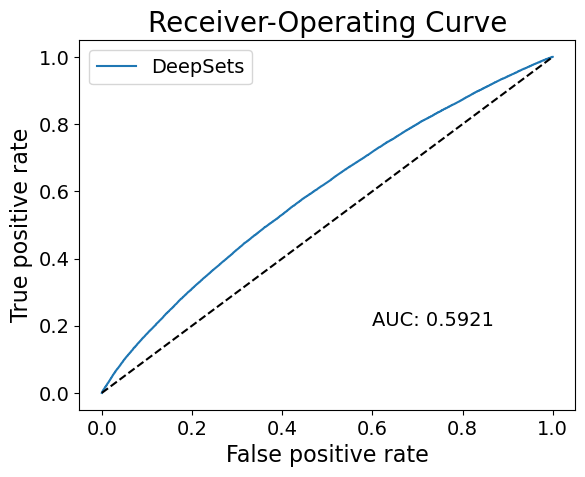

In [44]:
fpr, tpr, thresholds = metrics.roc_curve(test_targets, test_scores, pos_label=1, sample_weight=test_weights)

plt.plot(fpr, tpr, label="DeepSets")
plt.plot(np.linspace(0,1,2), np.linspace(0,1,2), '--', c="black")
plt.xlabel("False positive rate")
plt.ylabel("True positive rate")
plt.title("Receiver-Operating Curve")
plt.legend()
plt.text(0.6, 0.2, "AUC: {:.4}".format(metrics.roc_auc_score(test_targets, test_scores, sample_weight=test_weights)));

## Calibrate the model

In [45]:
iso = IsotonicRegression()
iso.fit(*carl_eval.get_scores(
    model,
    calibration_loader,
    device=DEVICE,
    leave=True
))

100%|██████████| 98/98 [00:09<00:00, 10.04it/s]


IsotonicRegression()

## Get the CARL weights

In [46]:
r_hats = carl_eval.get_r_hats(
            model,
            test_nominal_loader,
            device=DEVICE,
            leave=True
)

100%|██████████| 98/98 [00:07<00:00, 13.55it/s]


## Try calibrated weights also

In [47]:
calibrated_r_hats = carl_eval.get_calibrated_r_hats(
            model,
            iso.predict,
            test_nominal_loader,
            device=DEVICE,
            leave=True
)

100%|██████████| 98/98 [00:08<00:00, 10.98it/s]


# Plot the reweighted distributions

In [48]:
test_nominal_generator_data = carl_ppro.CombinedDataset(test_nominal_dataset)
test_PS_var_generator_data = carl_ppro.CombinedDataset(test_PS_var_dataset)

### Plot jet features

100%|██████████| 782/782 [00:02<00:00, 265.53it/s]
/home/mdrnevich/AGC/carl-for-agc/utils/plotting.py:193: RuntimeWarning: divide by zero encountered in divide
  x1_ratio = x0_hist/x1_hist
/home/mdrnevich/AGC/carl-for-agc/utils/plotting.py:193: RuntimeWarning: invalid value encountered in divide
  x1_ratio = x0_hist/x1_hist
/home/mdrnevich/AGC/carl-for-agc/utils/plotting.py:198: RuntimeWarning: divide by zero encountered in divide
  carl_ratio = carl_hist/x1_hist
/home/mdrnevich/AGC/carl-for-agc/utils/plotting.py:198: RuntimeWarning: invalid value encountered in divide
  carl_ratio = carl_hist/x1_hist
/home/mdrnevich/AGC/carl-for-agc/utils/plotting.py:235: RuntimeWarning: invalid value encountered in divide
  binsqrsum_x0 = binsqrsum_x0/w0[mask0].sum()
/home/mdrnevich/AGC/carl-for-agc/utils/plotting.py:239: RuntimeWarning: invalid value encountered in divide
  binsqrsum_x1 = binsqrsum_x1/w1[mask1].sum()


100000
100000


100%|██████████| 782/782 [00:03<00:00, 257.40it/s]


99988
99997


100%|██████████| 782/782 [00:02<00:00, 261.97it/s]


99874
99923


100%|██████████| 782/782 [00:03<00:00, 232.71it/s]


98921
99263


100%|██████████| 782/782 [00:05<00:00, 154.05it/s]


94967
96258


100%|██████████| 782/782 [00:09<00:00, 84.50it/s]


85118
88382


100%|██████████| 782/782 [00:16<00:00, 47.16it/s]


69387
74689


100%|██████████| 782/782 [00:25<00:00, 30.97it/s]


51005
57543


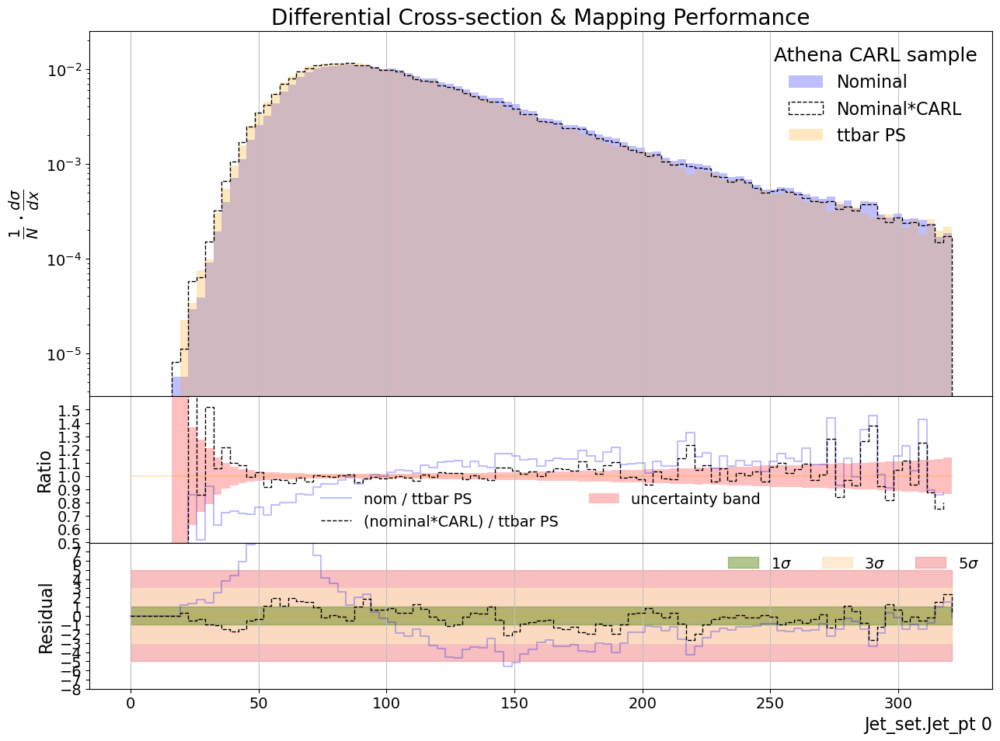

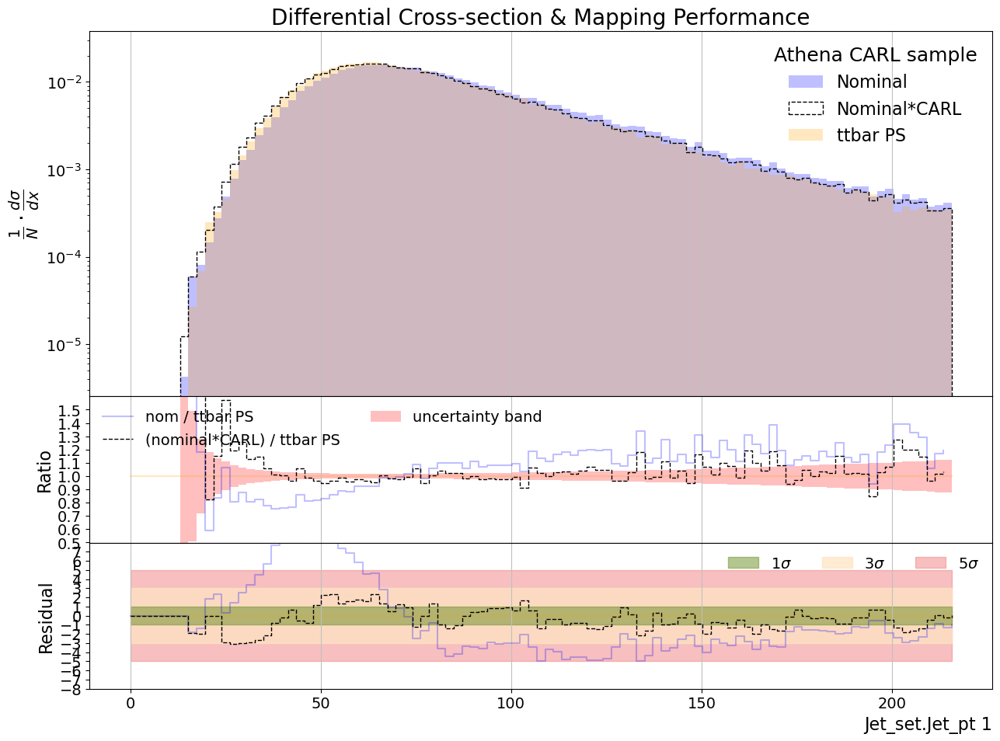

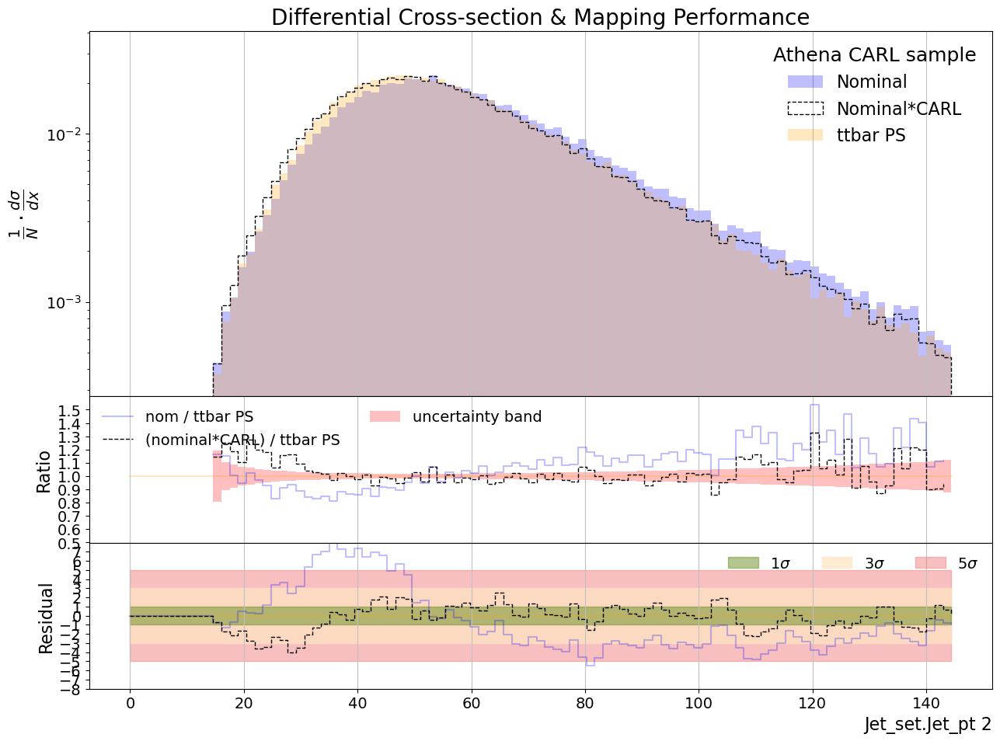

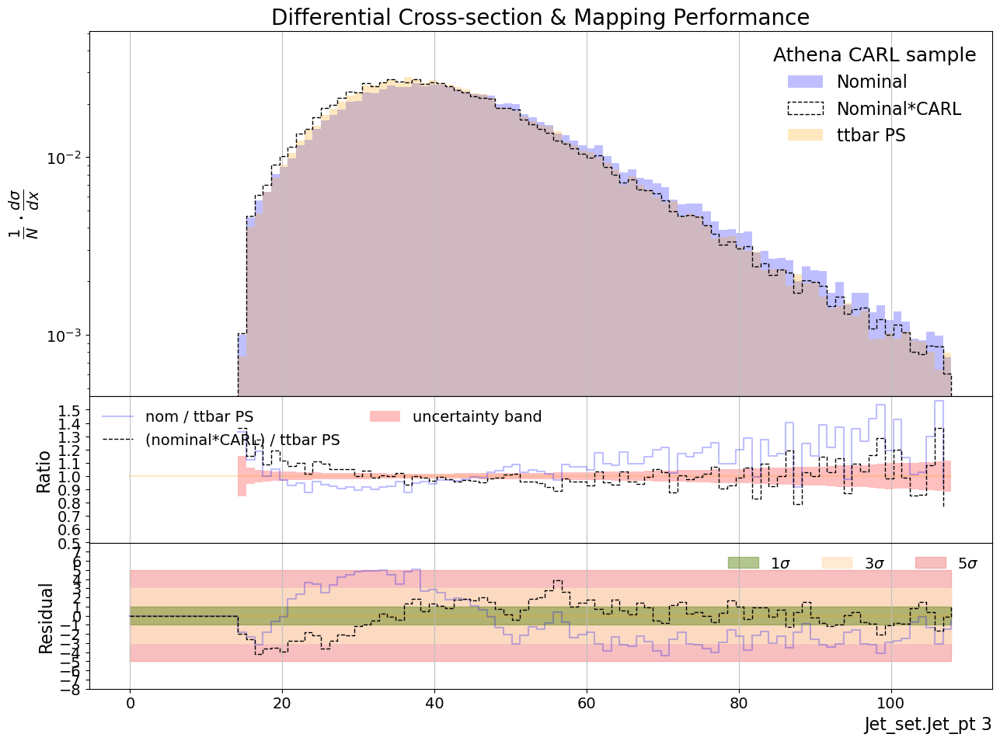

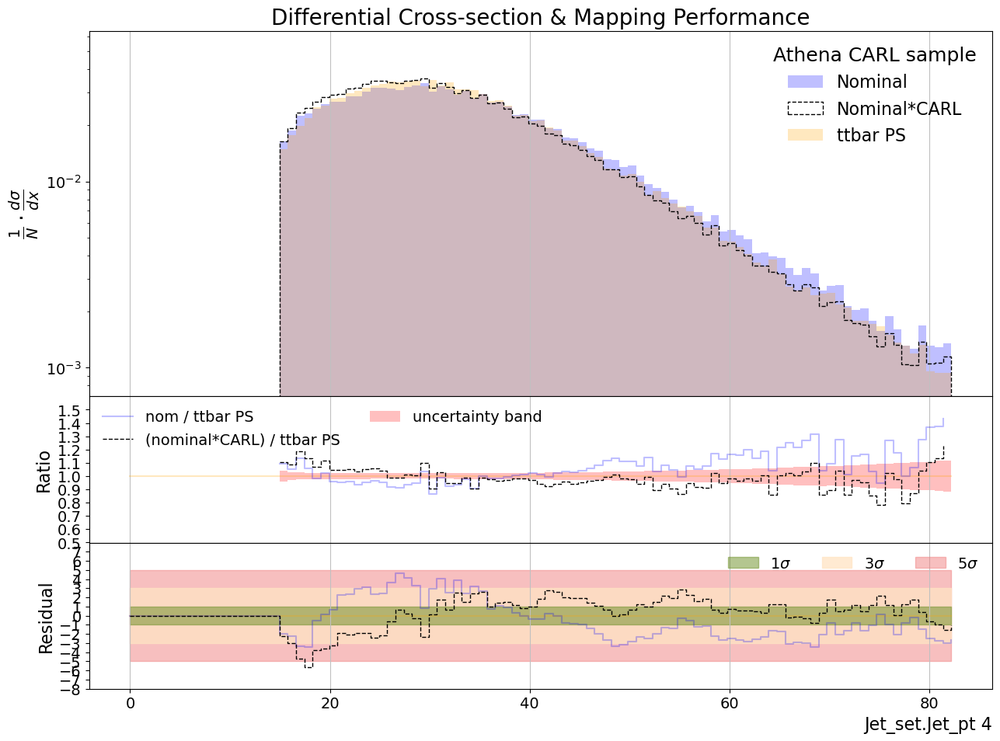

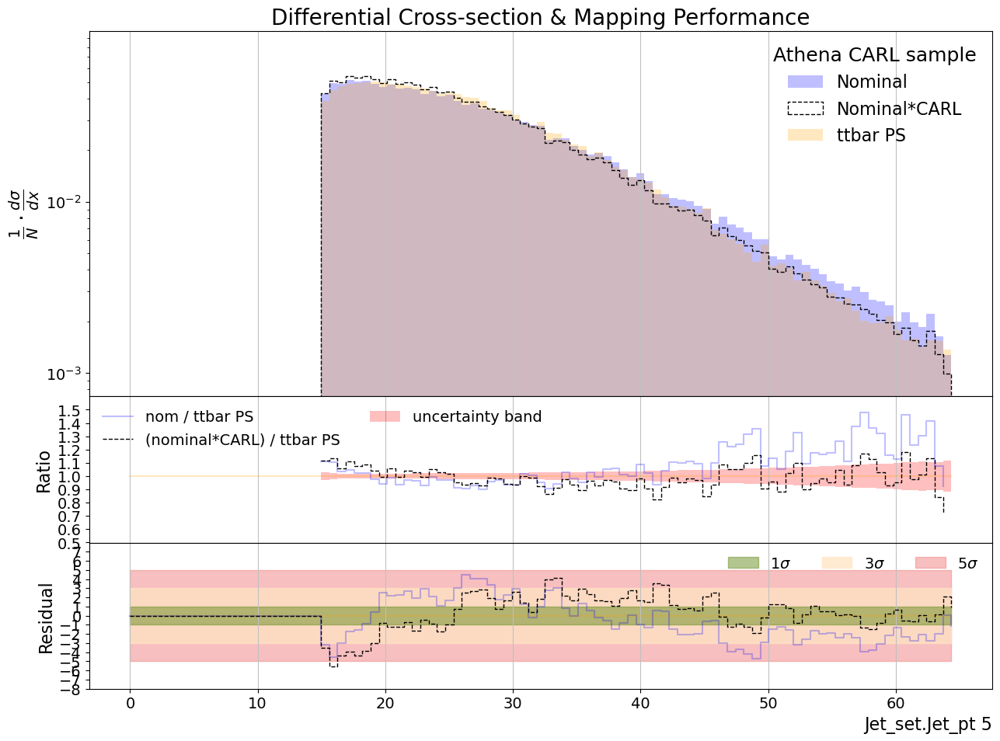

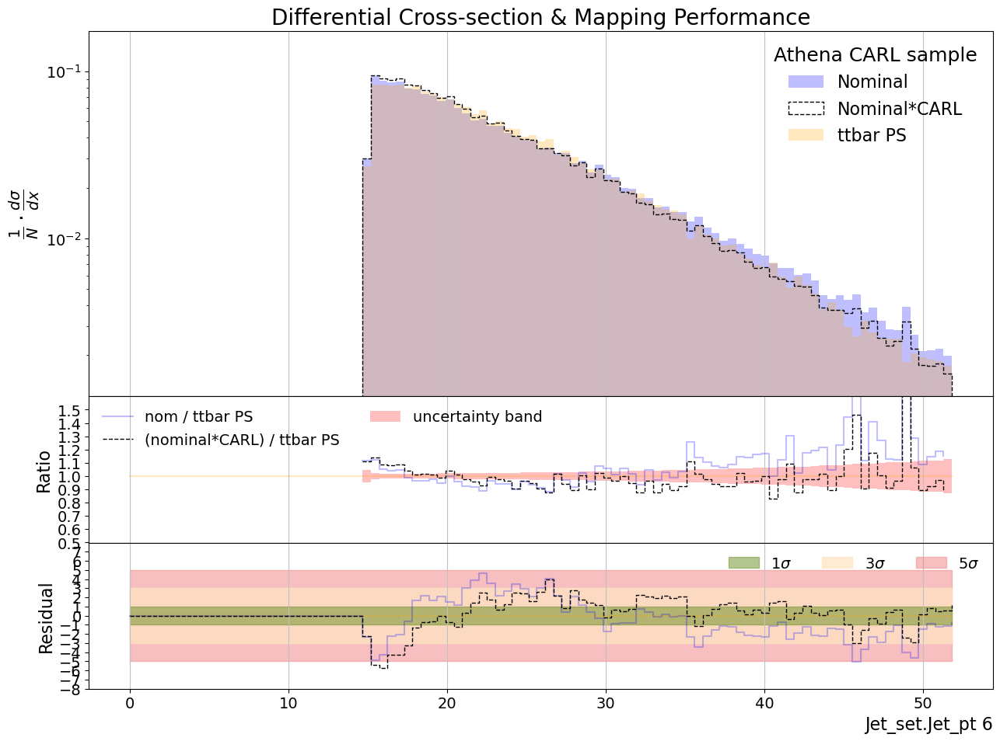

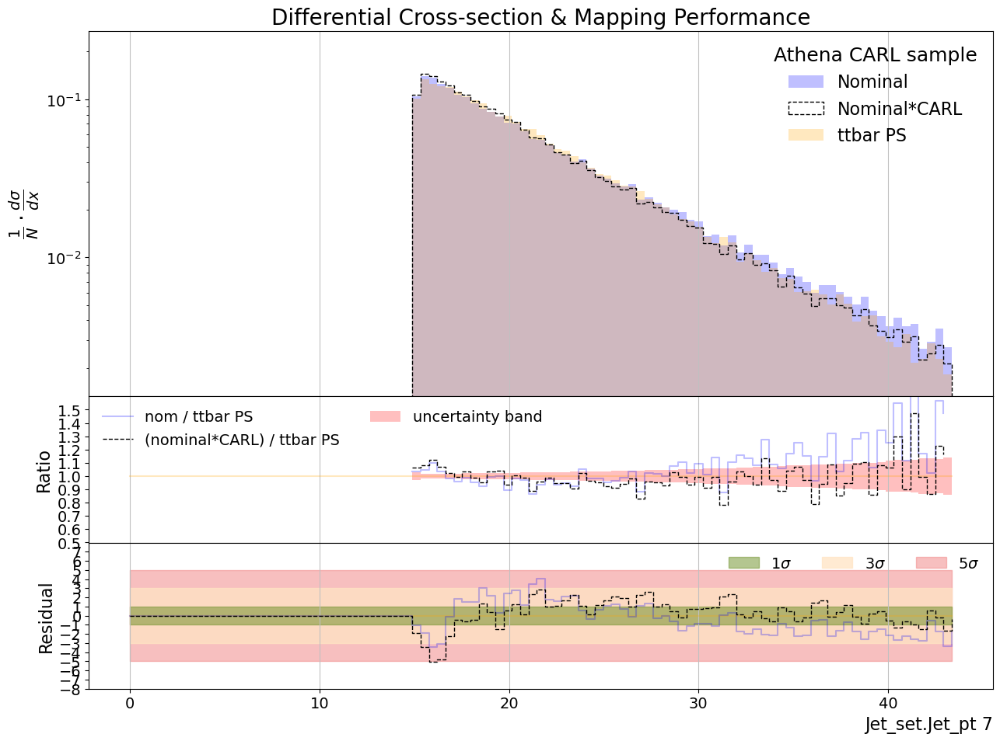

In [49]:
set_name = "Jet_set"
feature_name = "Jet_pt"

for i in range(8):
    carl_plot.plot_carl_reweighting(test_nominal_generator_data, test_PS_var_generator_data, r_hats, features,
                                    set_name, index=i, subfeature_name=feature_name, sort_feature="Jet_pt",
                                    alternate_name="ttbar PS", nominal_mask=np.isfinite, alternate_mask=np.isfinite, saveAs="plots/{}_{}{}.png".format(set_name, feature_name, i))

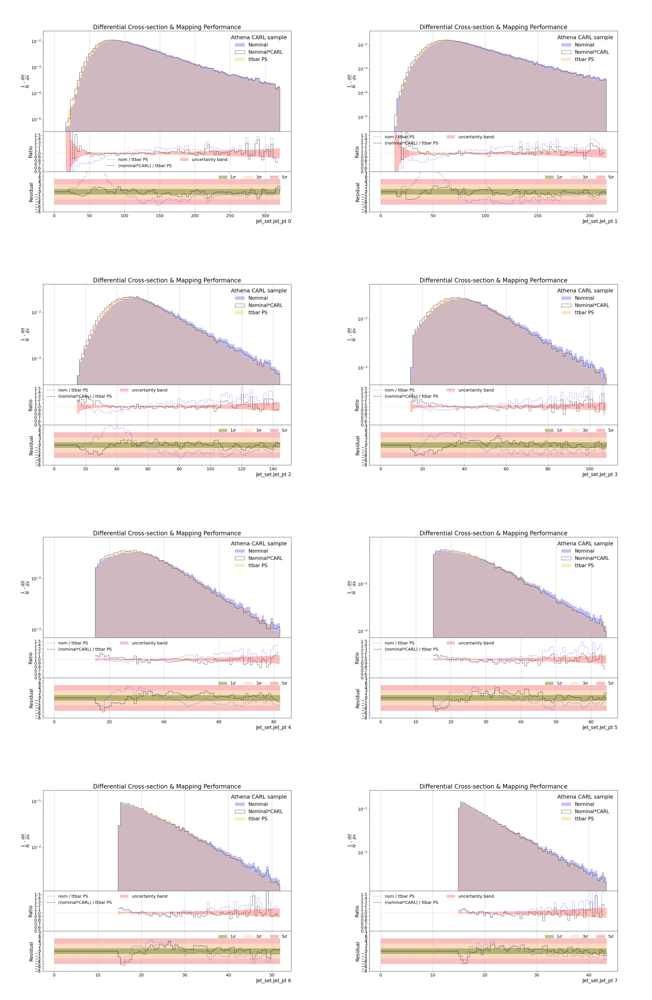

In [50]:
nrows = 4
ncolumns = 2

fig, axs = plt.subplots(nrows, ncolumns, figsize=(22,34))

set_name = "Jet_set"
feature_name = "Jet_pt"

for i in range(nrows):
    for j in range(ncolumns):
        im = plt.imread("plots/{}_{}{}.png".format(set_name, feature_name, i*ncolumns + j))
        axs[i,j].imshow(im)
        axs[i,j].axis('off')
fig.tight_layout()

100%|██████████| 782/782 [00:02<00:00, 262.68it/s]


100000
100000


100%|██████████| 782/782 [00:02<00:00, 264.04it/s]


99988
99997


100%|██████████| 782/782 [00:03<00:00, 255.25it/s]


99874
99923


100%|██████████| 782/782 [00:03<00:00, 220.24it/s]


98921
99263


100%|██████████| 782/782 [00:05<00:00, 149.65it/s]


94967
96258


100%|██████████| 782/782 [00:09<00:00, 83.94it/s]


85118
88382


100%|██████████| 782/782 [00:16<00:00, 47.88it/s]


69387
74689


100%|██████████| 782/782 [00:25<00:00, 30.11it/s]


51005
57543


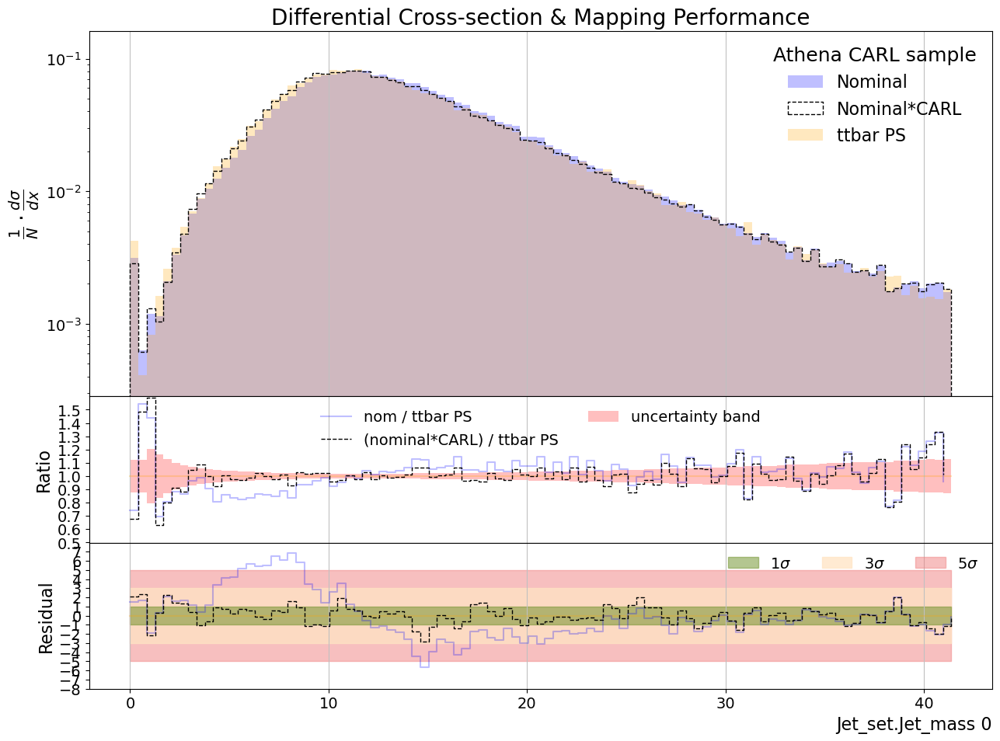

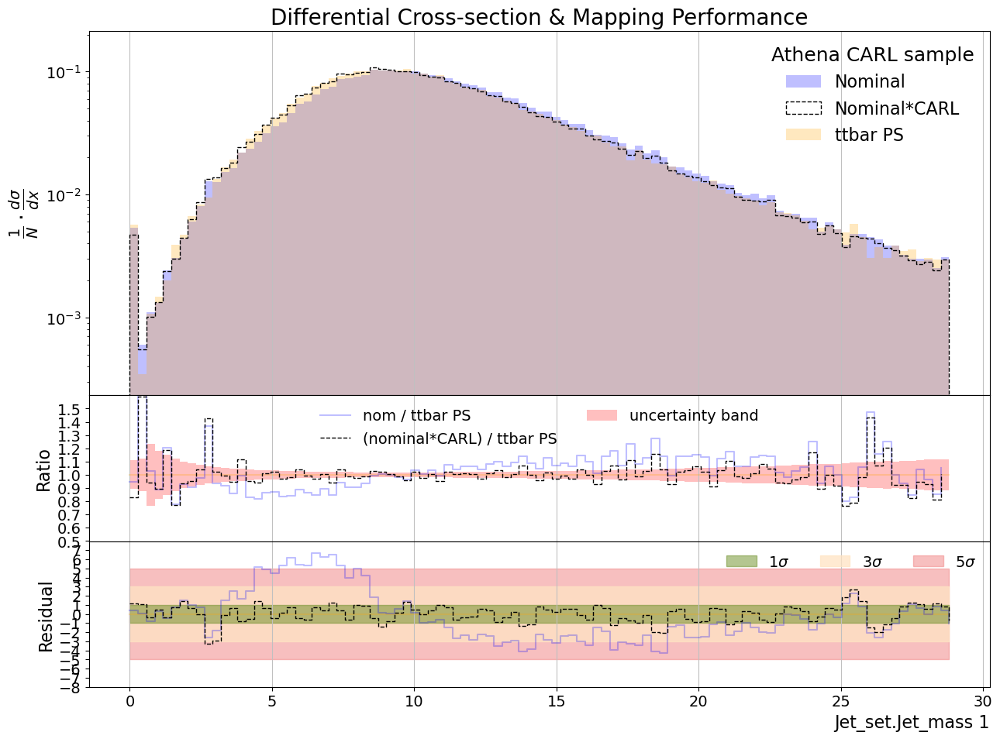

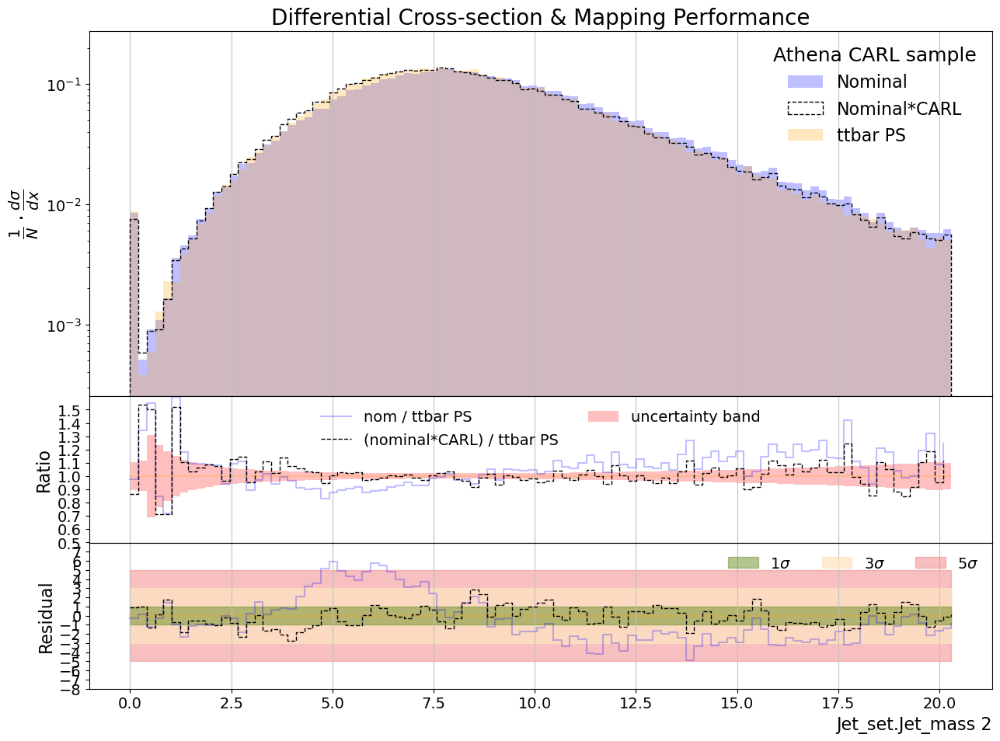

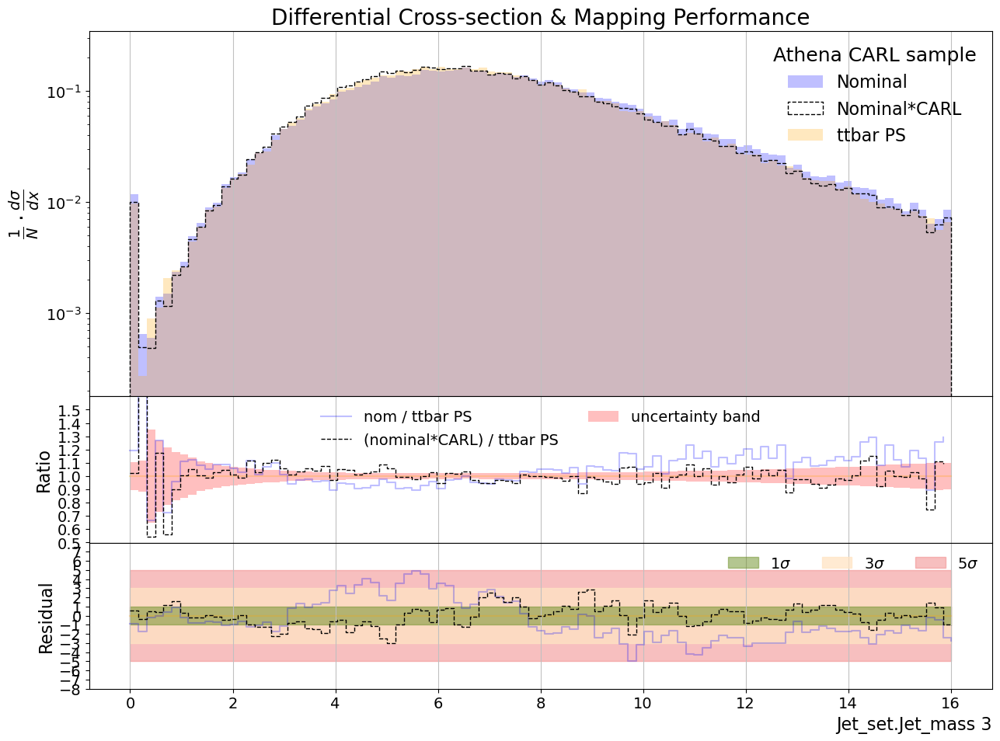

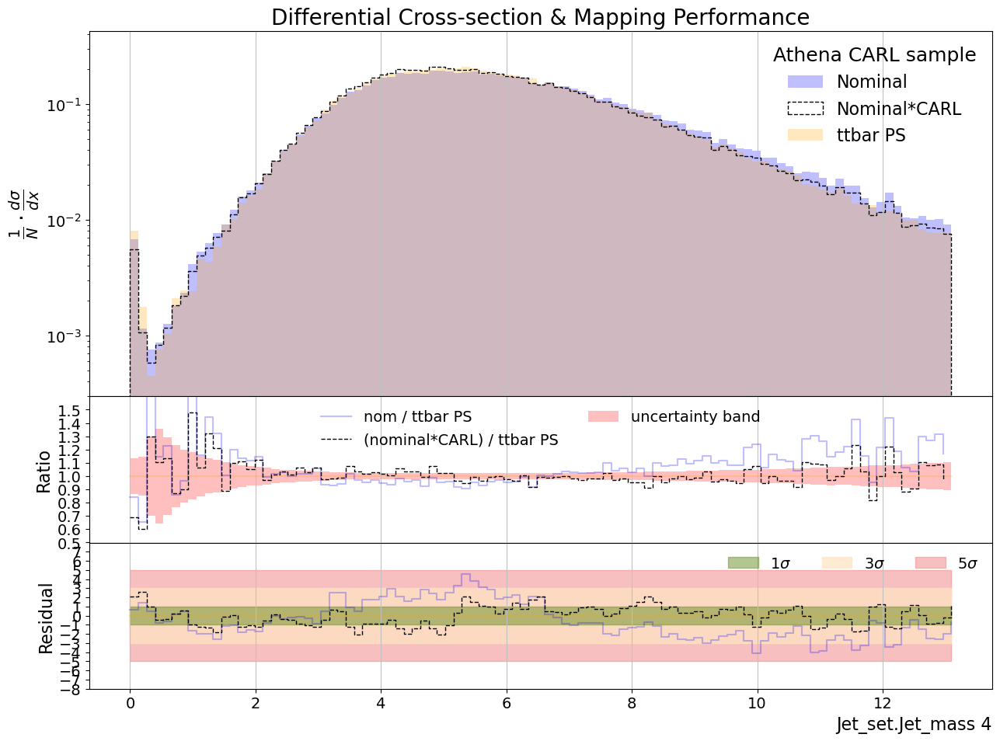

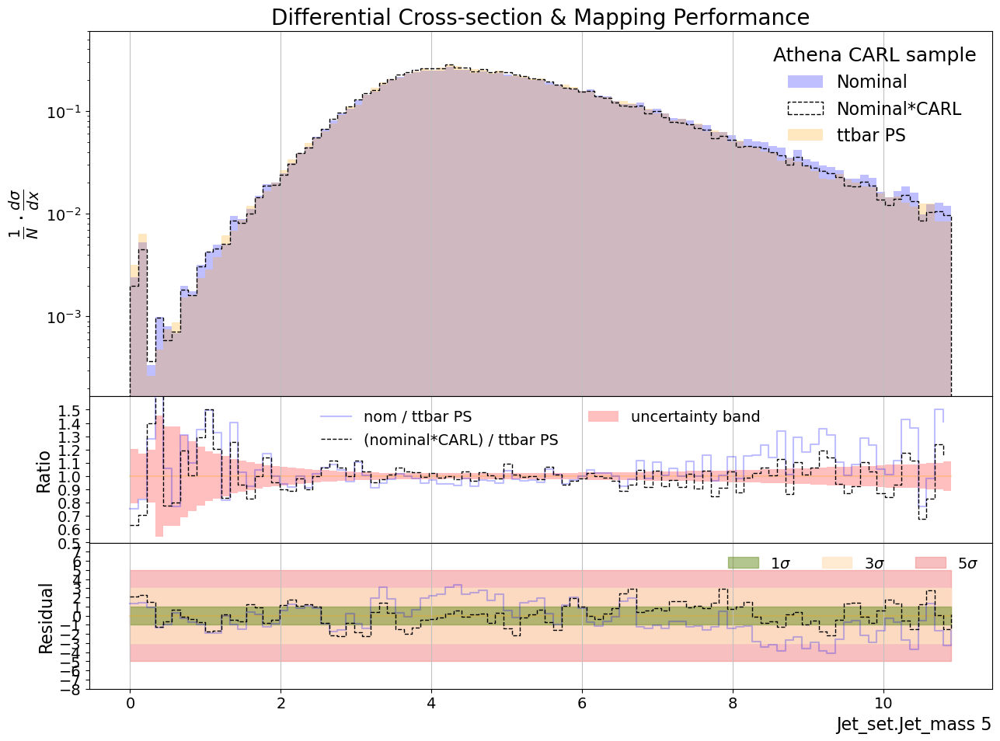

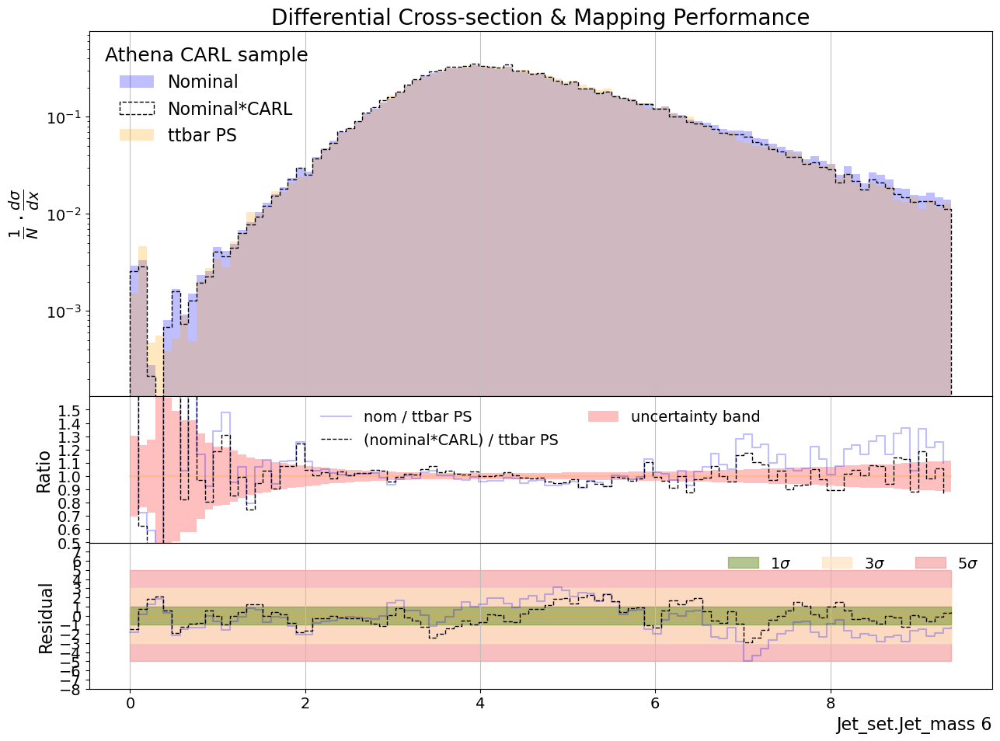

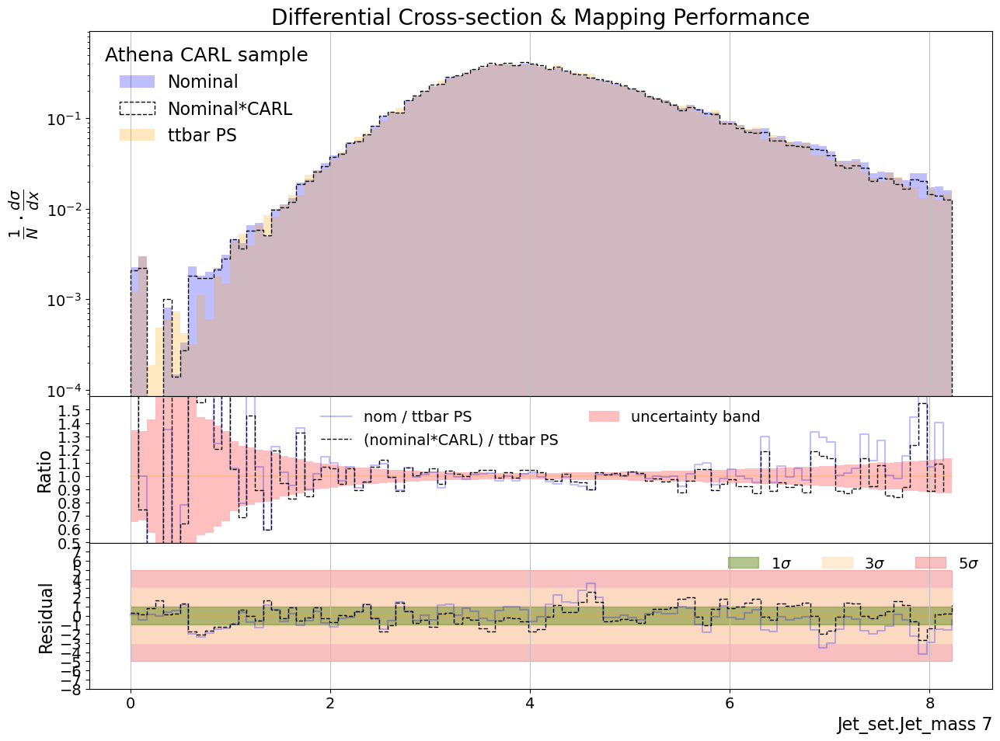

In [51]:
set_name = "Jet_set"
feature_name = "Jet_mass"

for i in range(8):
    carl_plot.plot_carl_reweighting(test_nominal_generator_data, test_PS_var_generator_data, r_hats, features,
                                    set_name, index=i, subfeature_name=feature_name, sort_feature="Jet_pt",
                                    alternate_name="ttbar PS", nominal_mask=np.isfinite, alternate_mask=np.isfinite, saveAs="plots/{}_{}{}.png".format(set_name, feature_name, i))

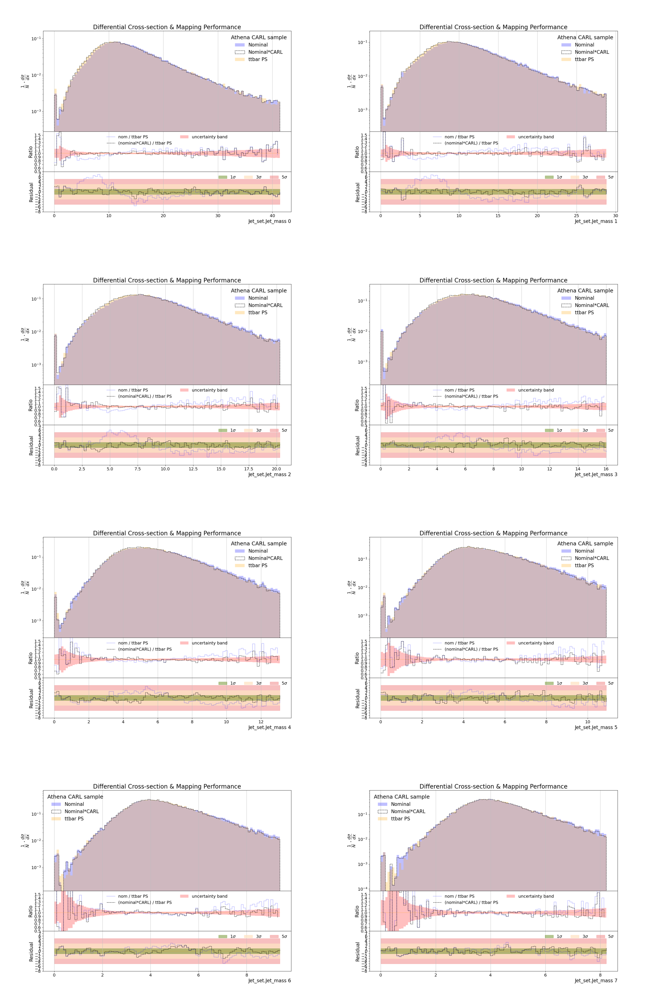

In [52]:
nrows = 4
ncolumns = 2

fig, axs = plt.subplots(nrows, ncolumns, figsize=(22,34))

set_name = "Jet_set"
feature_name = "Jet_mass"

for i in range(nrows):
    for j in range(ncolumns):
        im = plt.imread("plots/{}_{}{}.png".format(set_name, feature_name, i*ncolumns + j))
        axs[i,j].imshow(im)
        axs[i,j].axis('off')
fig.tight_layout()

100%|██████████| 782/782 [00:03<00:00, 244.46it/s]


100000
100000


100%|██████████| 782/782 [00:03<00:00, 257.00it/s]


99988
99997


100%|██████████| 782/782 [00:02<00:00, 262.23it/s]


99874
99923


100%|██████████| 782/782 [00:03<00:00, 227.06it/s]


98921
99263


100%|██████████| 782/782 [00:04<00:00, 157.34it/s]


94967
96258


100%|██████████| 782/782 [00:09<00:00, 85.97it/s]


85118
88382


100%|██████████| 782/782 [00:16<00:00, 47.81it/s]


69387
74689


100%|██████████| 782/782 [00:25<00:00, 30.60it/s]


51005
57543


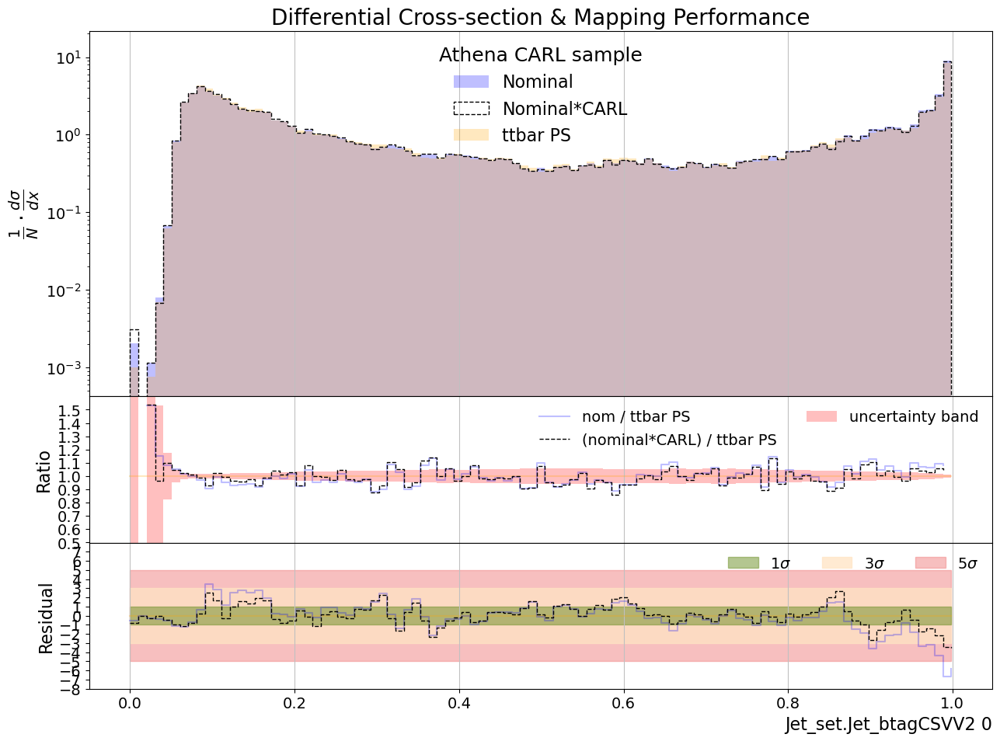

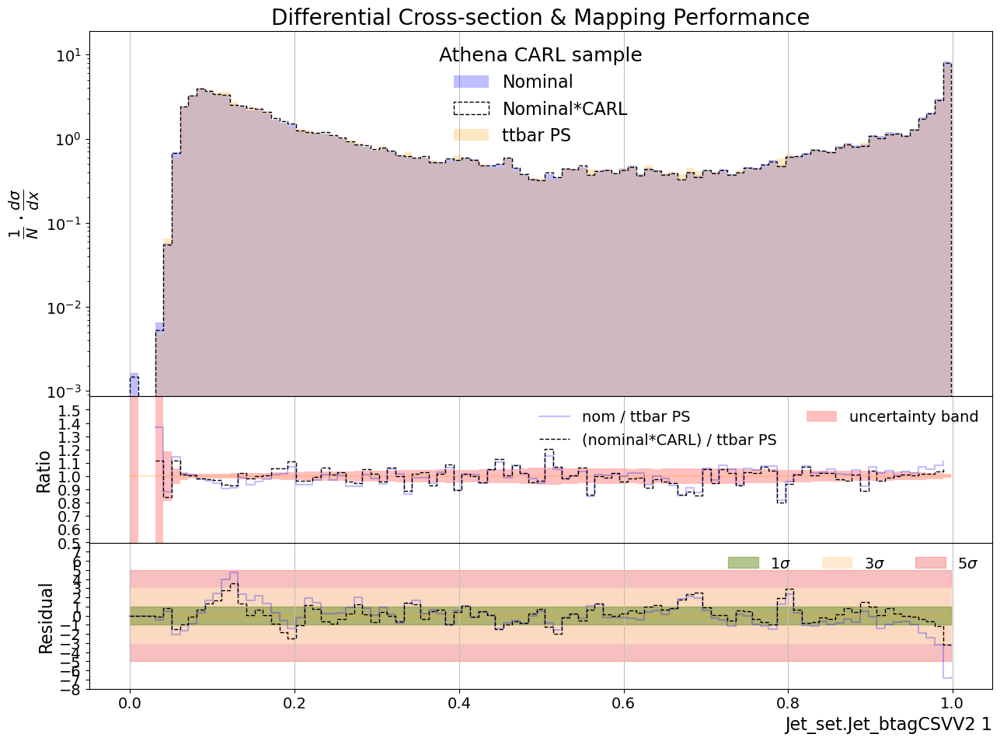

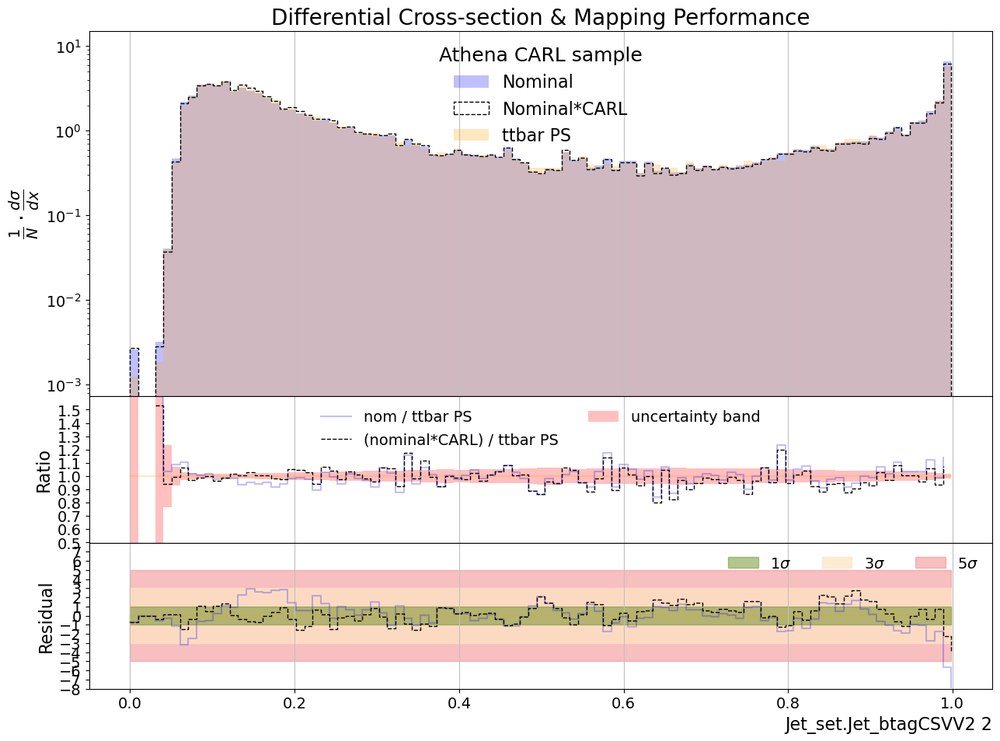

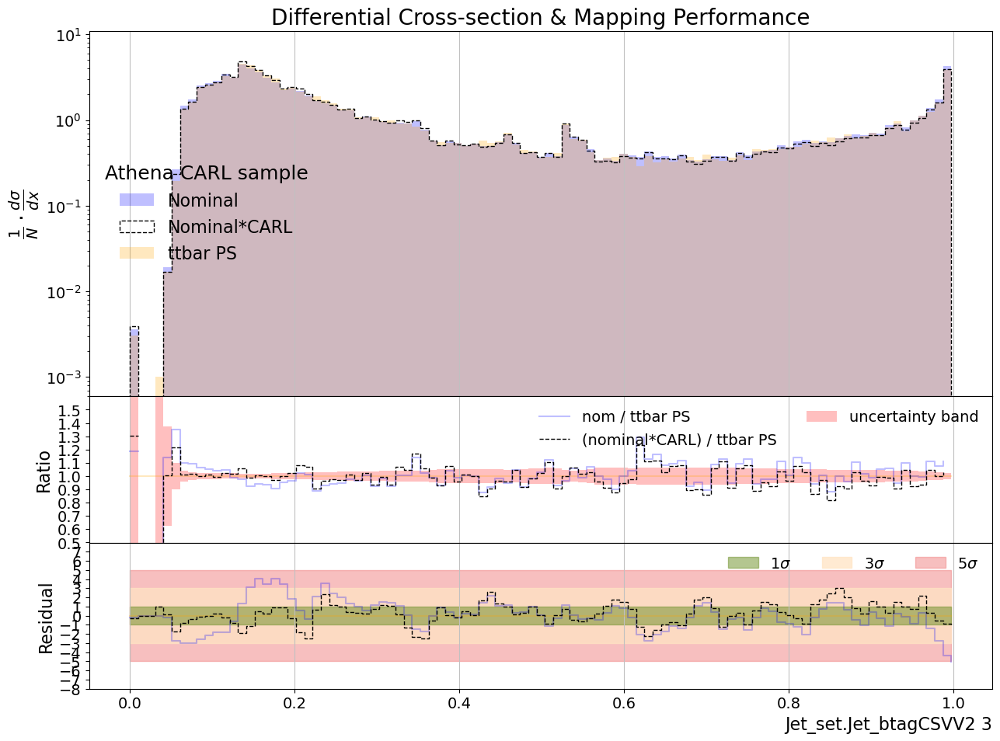

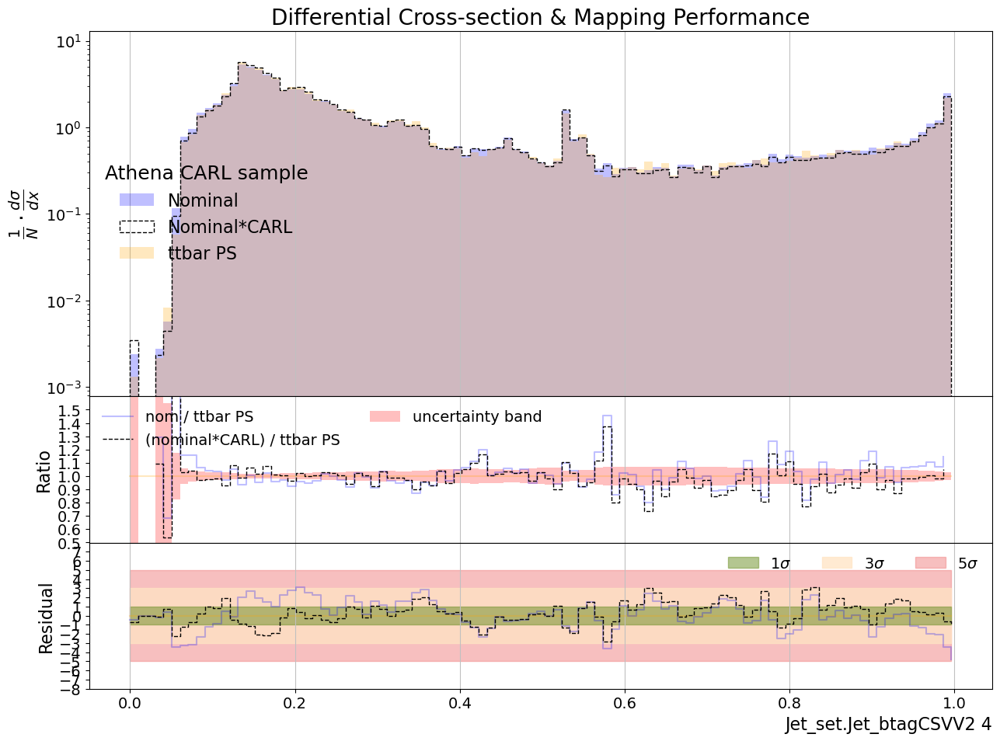

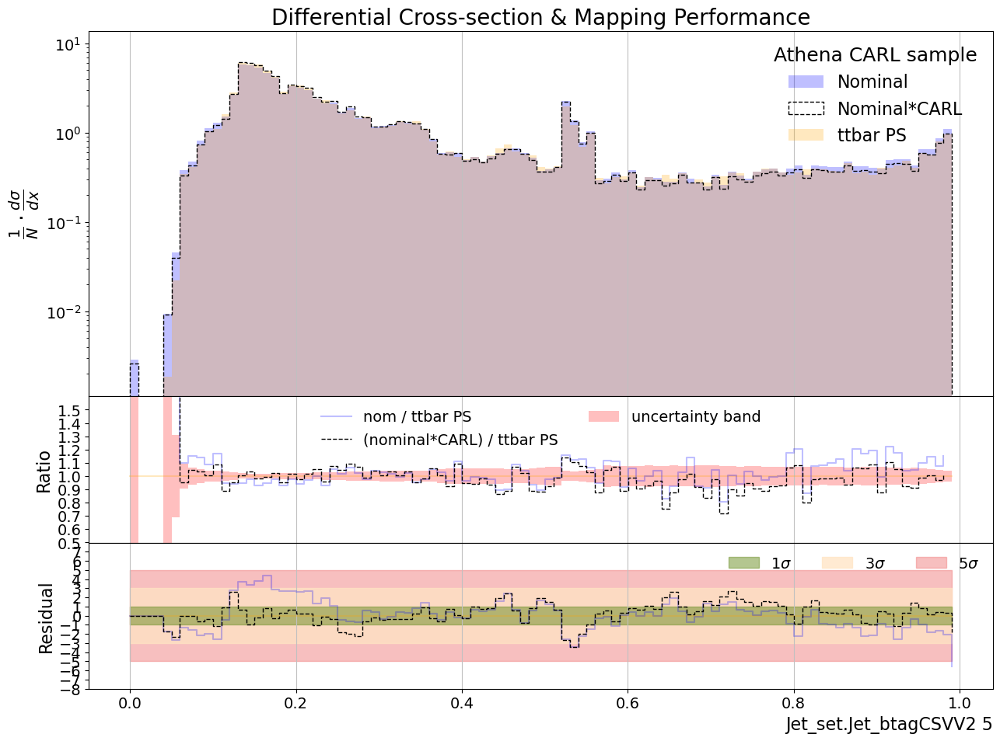

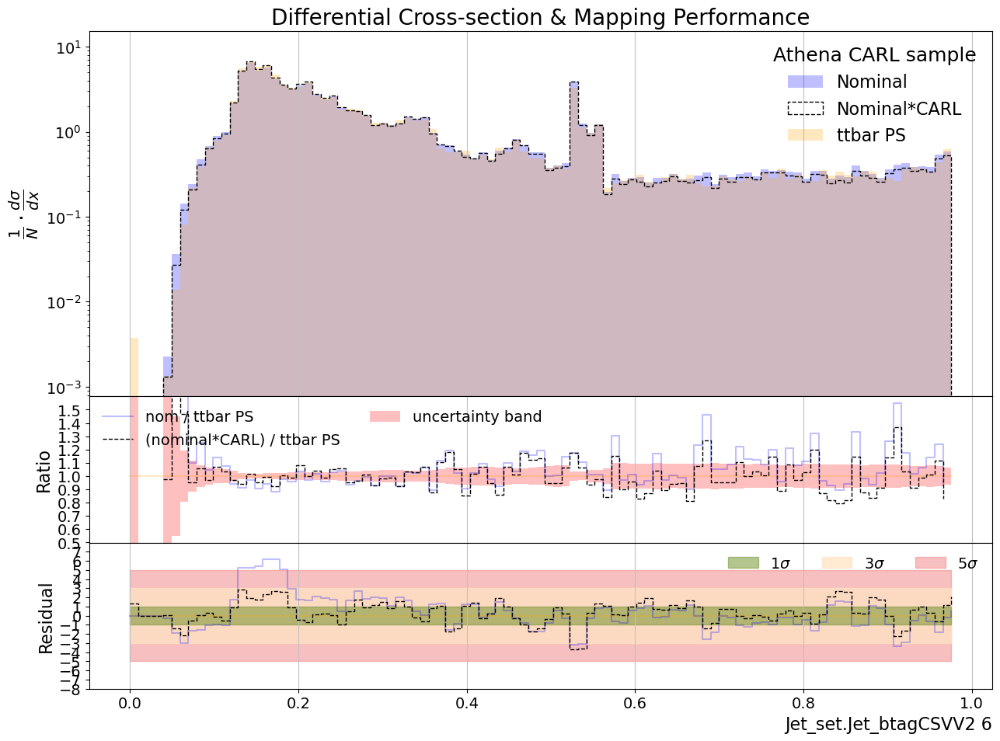

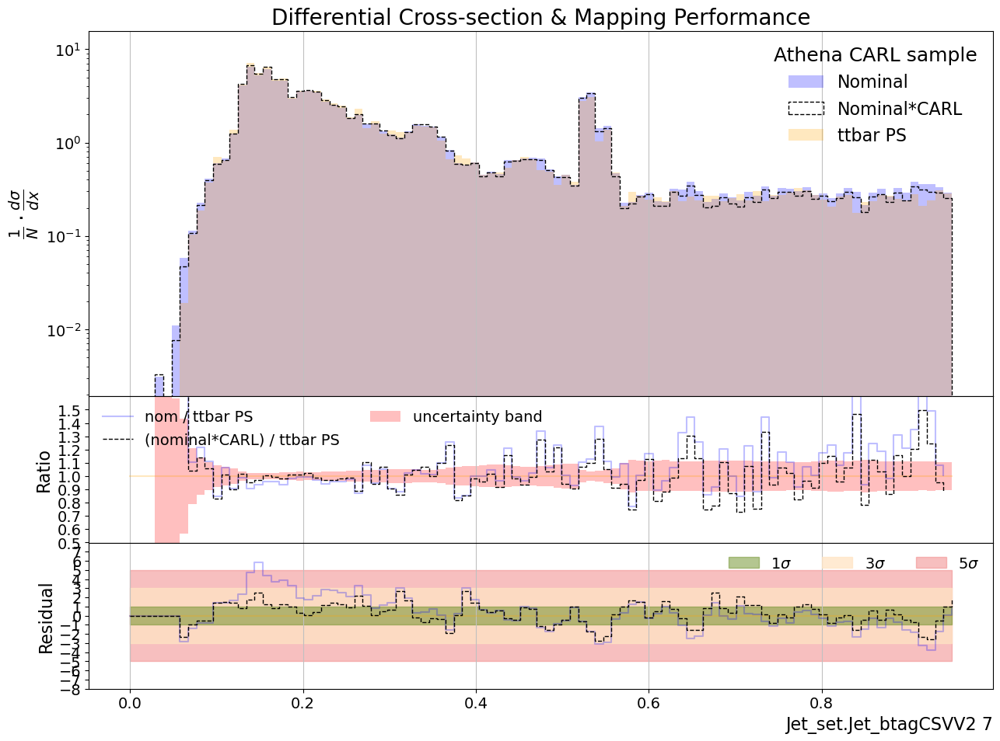

In [53]:
set_name = "Jet_set"
feature_name = "Jet_btagCSVV2"

for i in range(8):
    carl_plot.plot_carl_reweighting(test_nominal_generator_data, test_PS_var_generator_data, r_hats, features,
                                    set_name, index=i, subfeature_name=feature_name, sort_feature="Jet_pt",
                                    alternate_name="ttbar PS", nominal_mask=np.isfinite, alternate_mask=np.isfinite, saveAs="plots/{}_{}{}.png".format(set_name, feature_name, i))

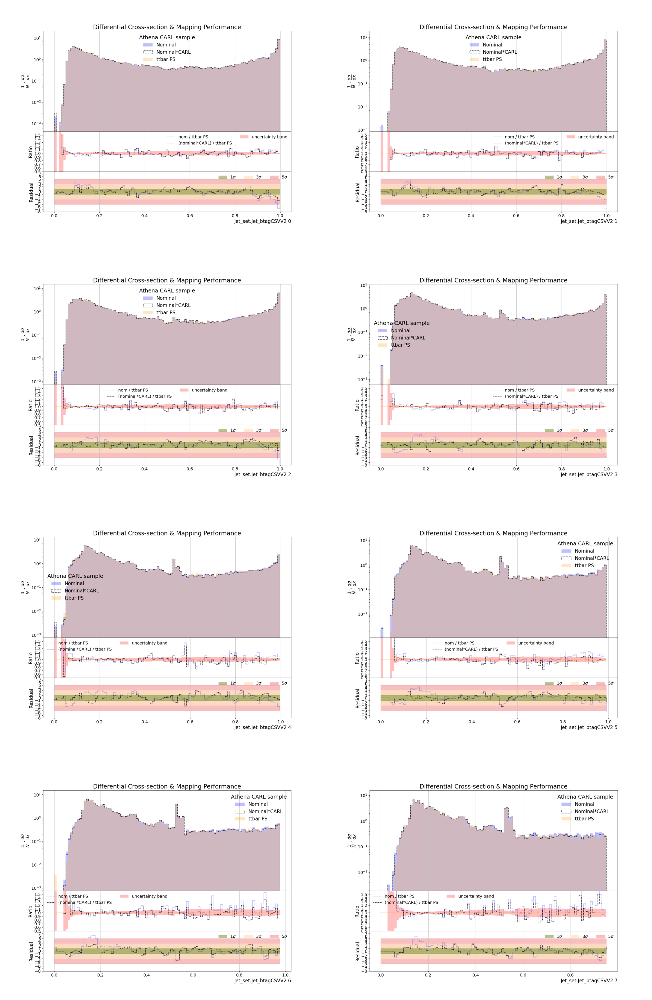

In [54]:
nrows = 4
ncolumns = 2

fig, axs = plt.subplots(nrows, ncolumns, figsize=(22,34))

set_name = "Jet_set"
feature_name = "Jet_btagCSVV2"

for i in range(nrows):
    for j in range(ncolumns):
        im = plt.imread("plots/{}_{}{}.png".format(set_name, feature_name, i*ncolumns + j))
        axs[i,j].imshow(im)
        axs[i,j].axis('off')
fig.tight_layout()

### Plot  FatJet features

100%|██████████| 782/782 [00:43<00:00, 17.89it/s]


23699
22031


100%|██████████| 782/782 [00:50<00:00, 15.43it/s]


9528
8740


100%|██████████| 782/782 [00:55<00:00, 14.17it/s]


1273
1041


100%|██████████| 782/782 [00:55<00:00, 14.17it/s]


181
131


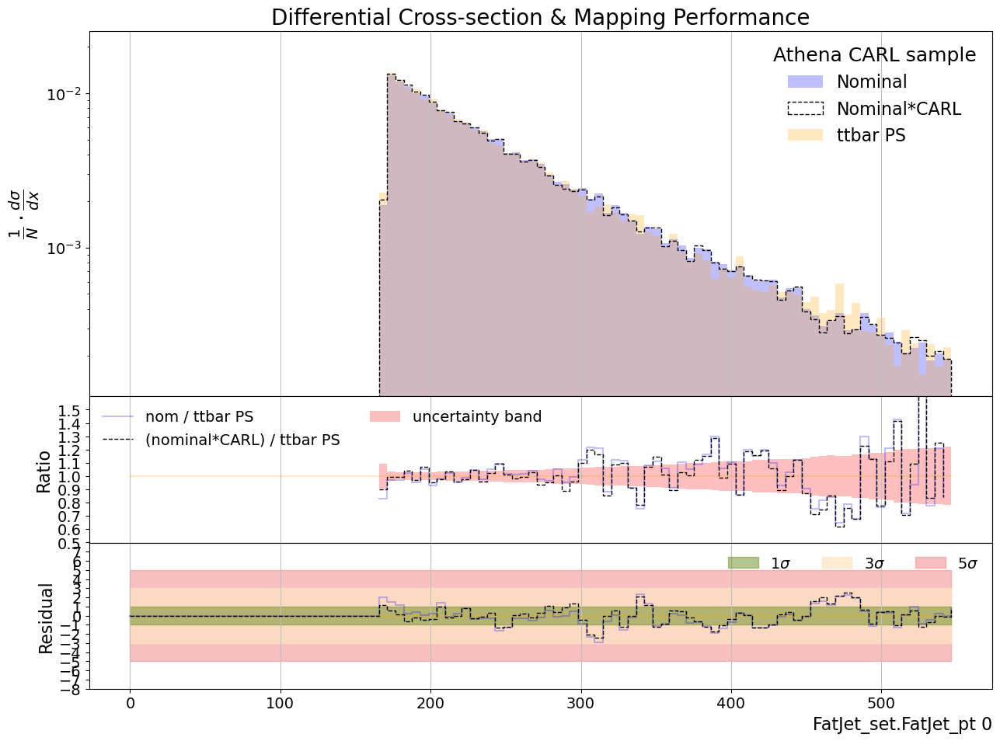

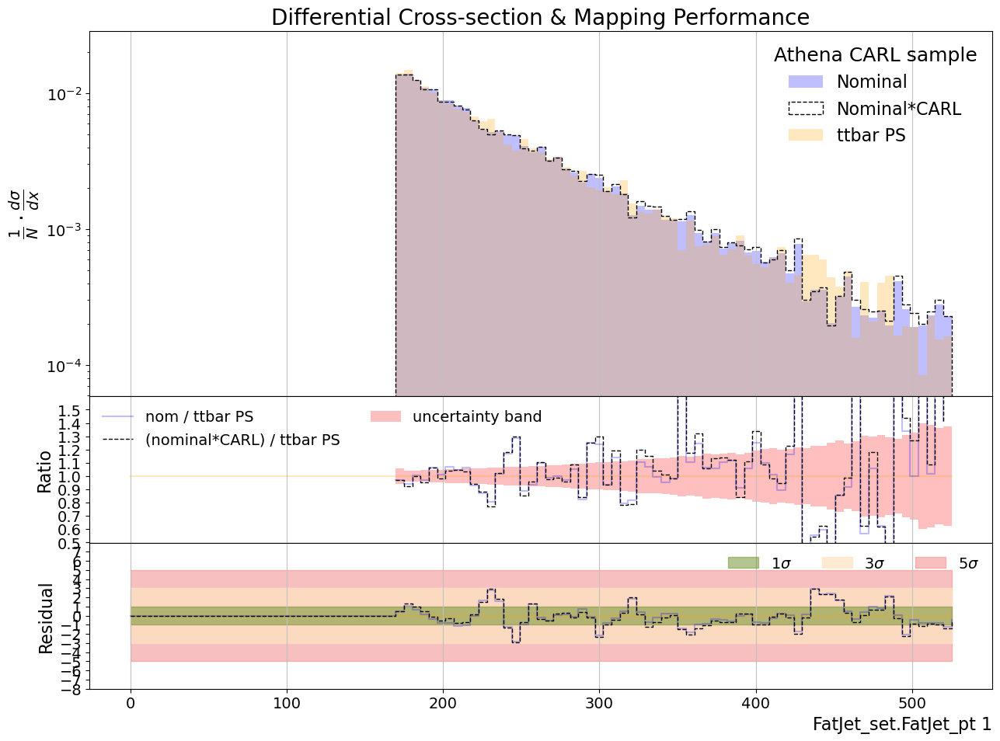

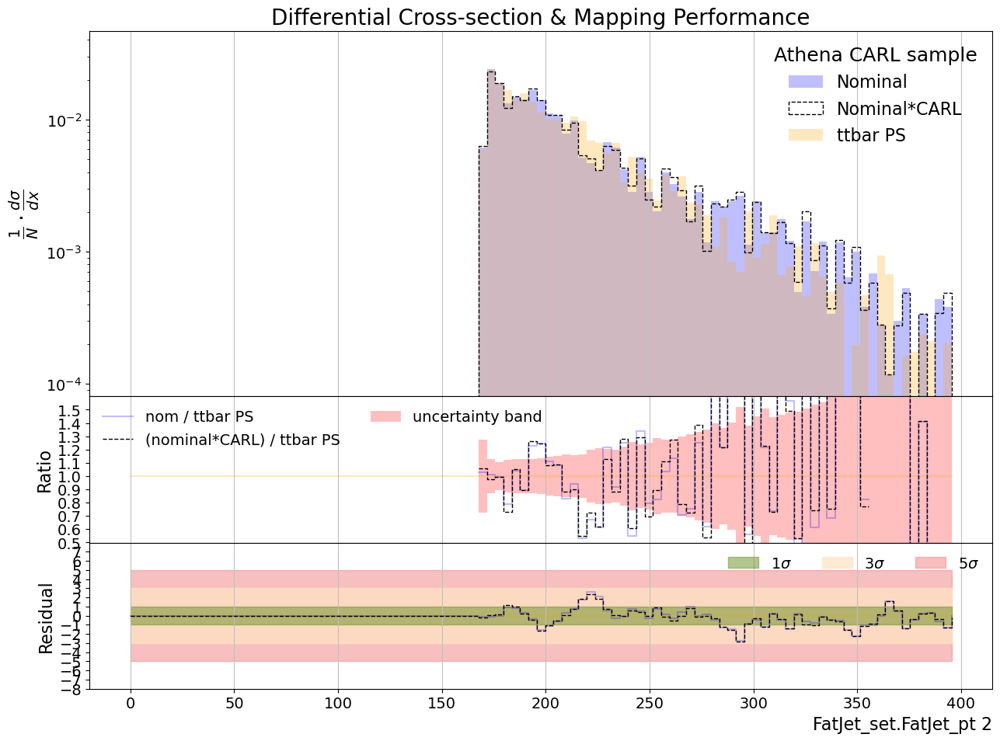

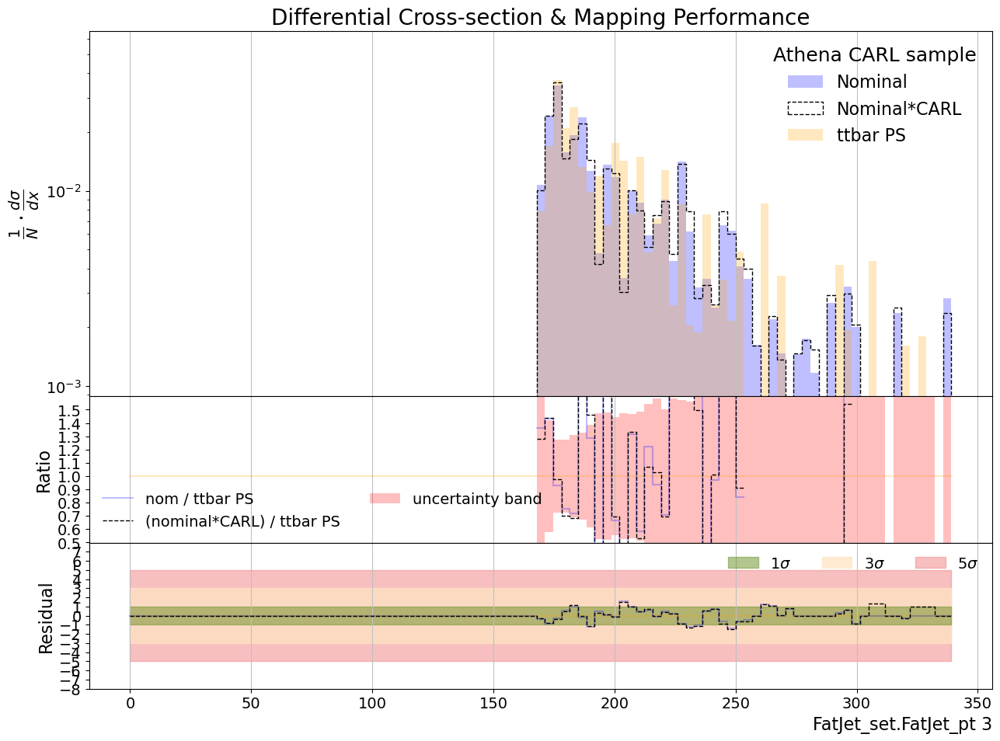

In [55]:
set_name = "FatJet_set"
feature_name = "FatJet_pt"

for i in range(4):
    carl_plot.plot_carl_reweighting(test_nominal_generator_data, test_PS_var_generator_data, r_hats, features,
                                    set_name, index=i, subfeature_name=feature_name, sort_feature="FatJet_pt",
                                    alternate_name="ttbar PS", nominal_mask=np.isfinite, alternate_mask=np.isfinite, saveAs="plots/{}_{}{}.png".format(set_name, feature_name, i))

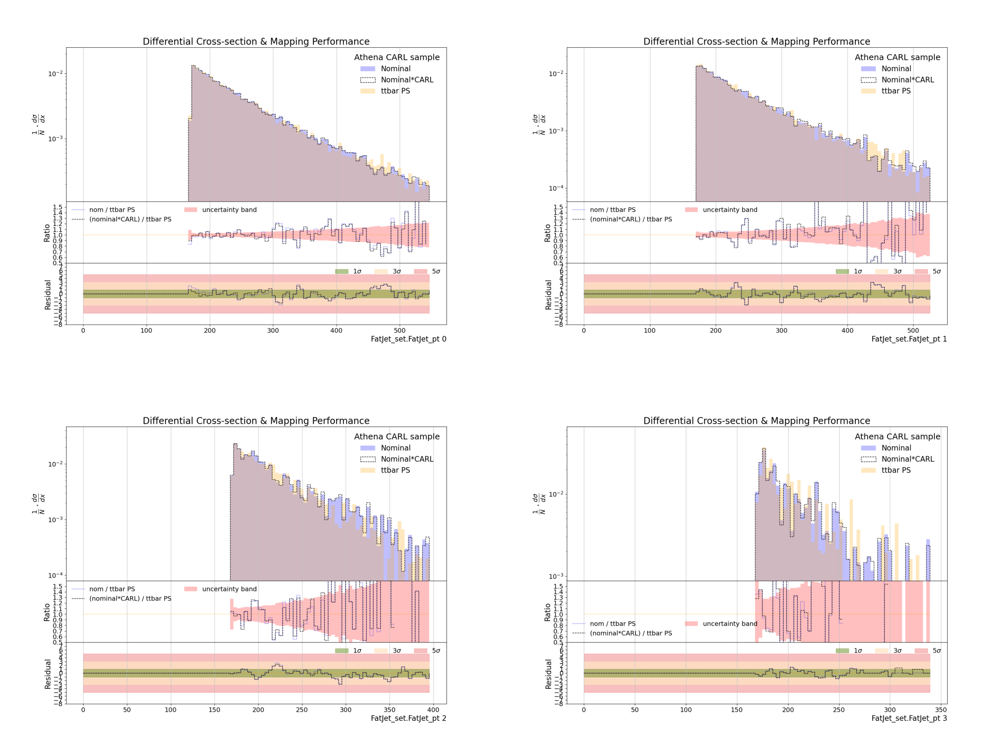

In [56]:
nrows = 2
ncolumns = 2

fig, axs = plt.subplots(nrows, ncolumns, figsize=(22,17))

set_name = "FatJet_set"
feature_name = "FatJet_pt"

for i in range(nrows):
    for j in range(ncolumns):
        im = plt.imread("plots/{}_{}{}.png".format(set_name, feature_name, i*ncolumns + j))
        axs[i,j].imshow(im)
        axs[i,j].axis('off')
fig.tight_layout()

100%|██████████| 782/782 [00:43<00:00, 17.88it/s]


23699
22031


100%|██████████| 782/782 [00:50<00:00, 15.46it/s]


9528
8740


100%|██████████| 782/782 [00:54<00:00, 14.32it/s]


1273
1041


100%|██████████| 782/782 [00:55<00:00, 14.20it/s]


181
131


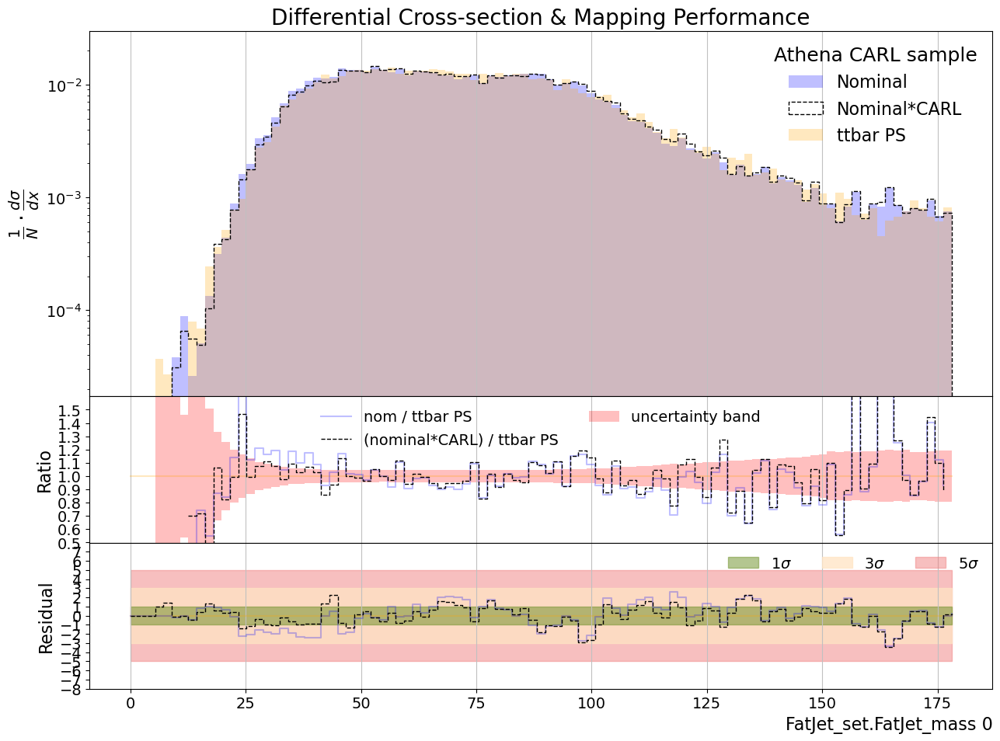

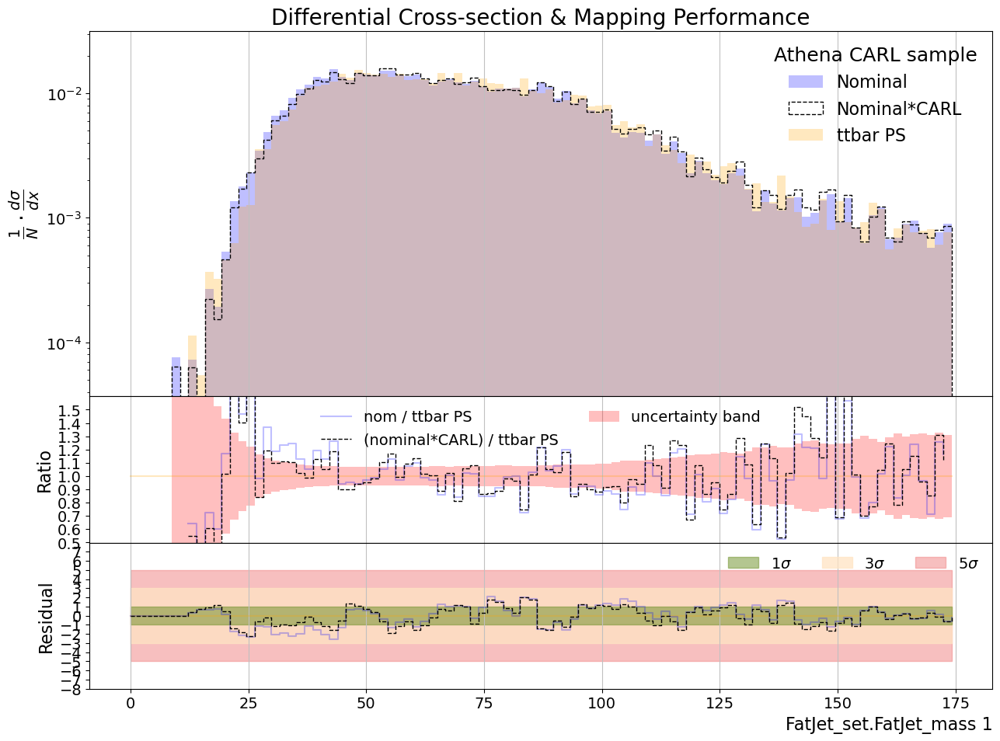

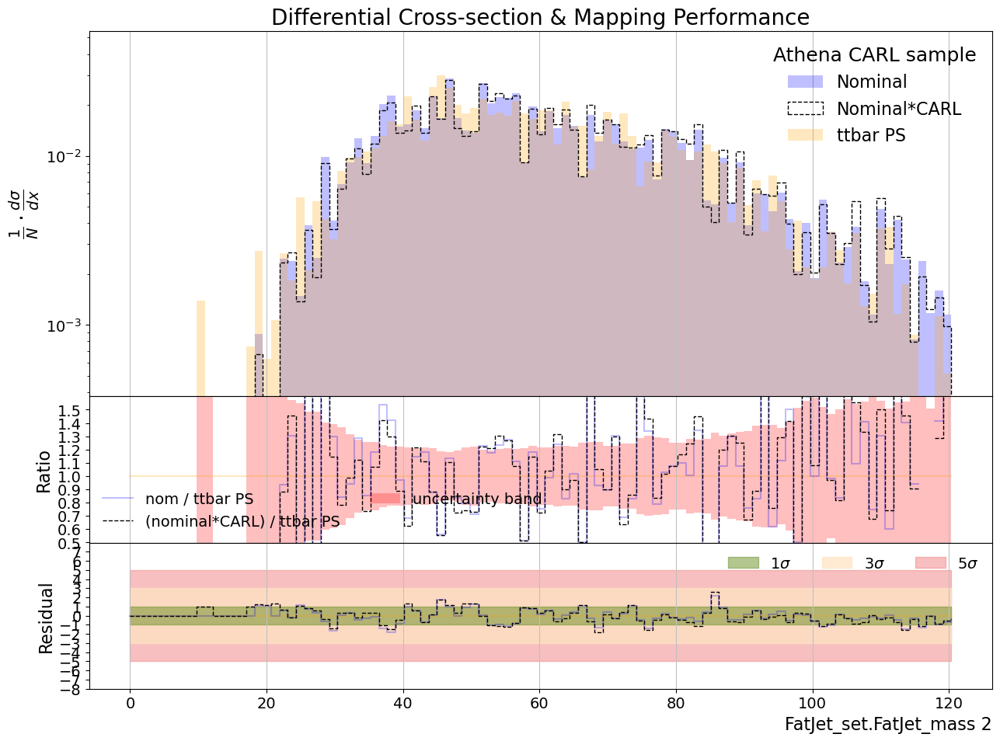

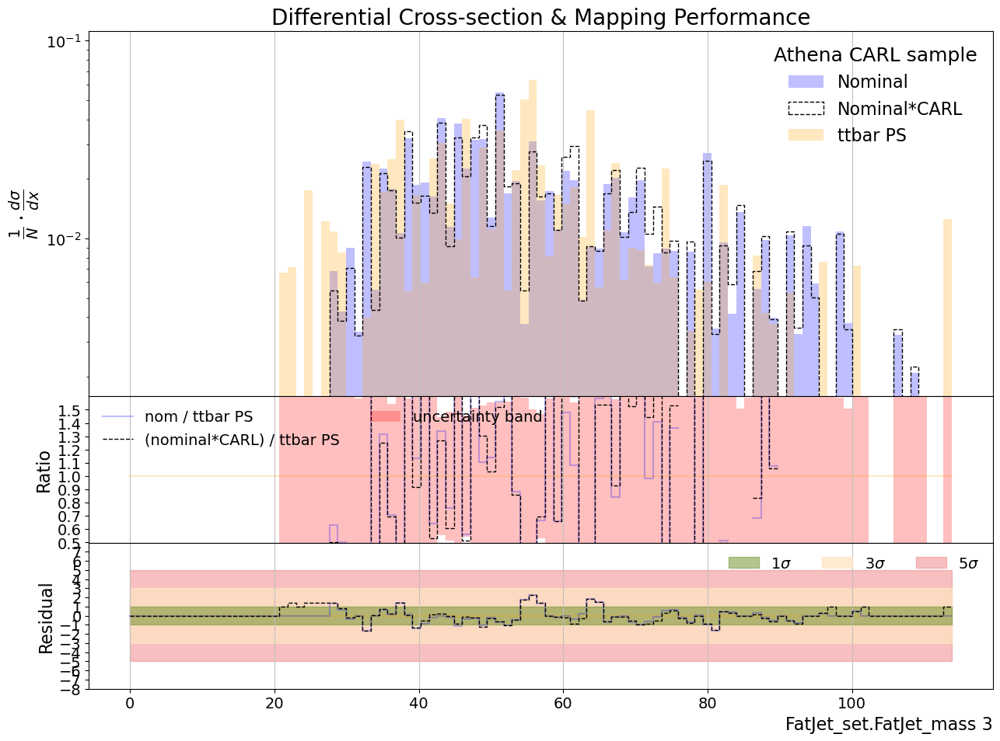

In [62]:
set_name = "FatJet_set"
feature_name = "FatJet_mass"

for i in range(4):
    carl_plot.plot_carl_reweighting(test_nominal_generator_data, test_PS_var_generator_data, r_hats, features,
                                    set_name, index=i, subfeature_name=feature_name, sort_feature="FatJet_pt",
                                    alternate_name="ttbar PS", nominal_mask=np.isfinite, alternate_mask=np.isfinite, saveAs="plots/{}_{}{}.png".format(set_name, feature_name, i))

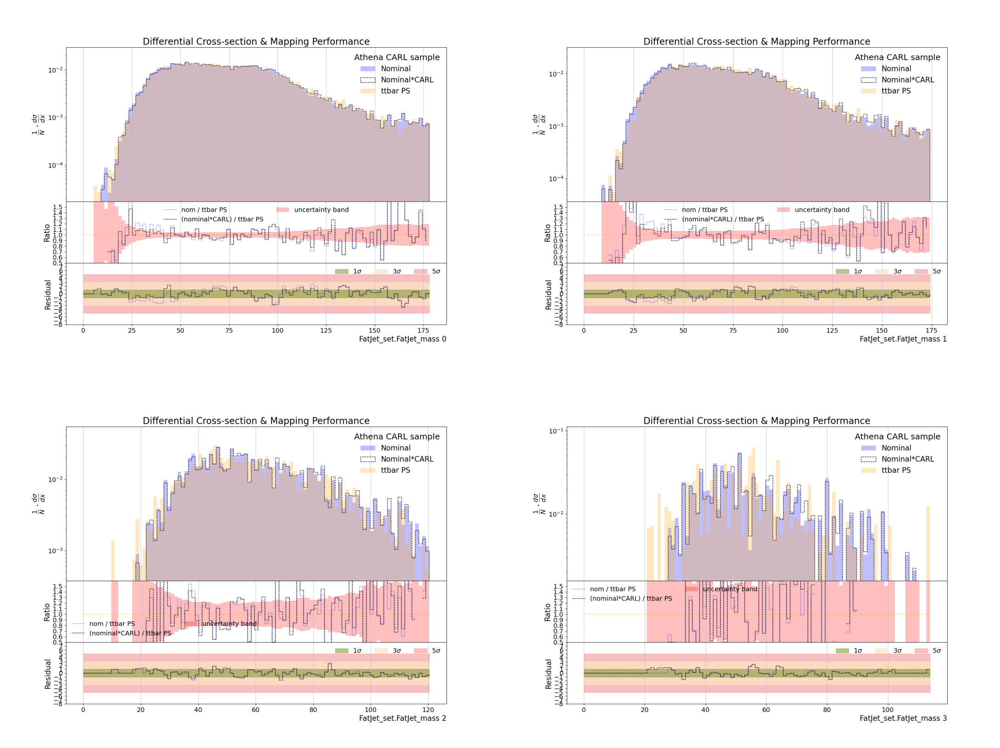

In [63]:
nrows = 2
ncolumns = 2

fig, axs = plt.subplots(nrows, ncolumns, figsize=(22,17))

set_name = "FatJet_set"
feature_name = "FatJet_mass"

for i in range(nrows):
    for j in range(ncolumns):
        im = plt.imread("plots/{}_{}{}.png".format(set_name, feature_name, i*ncolumns + j))
        axs[i,j].imshow(im)
        axs[i,j].axis('off')
fig.tight_layout()

### Plot electron features

100%|██████████| 782/782 [00:17<00:00, 43.79it/s]


71894
71845


100%|██████████| 782/782 [00:38<00:00, 20.52it/s]


34540
34354


100%|██████████| 782/782 [00:49<00:00, 15.88it/s]


11679
11856


100%|██████████| 782/782 [00:53<00:00, 14.54it/s]


3196
3076


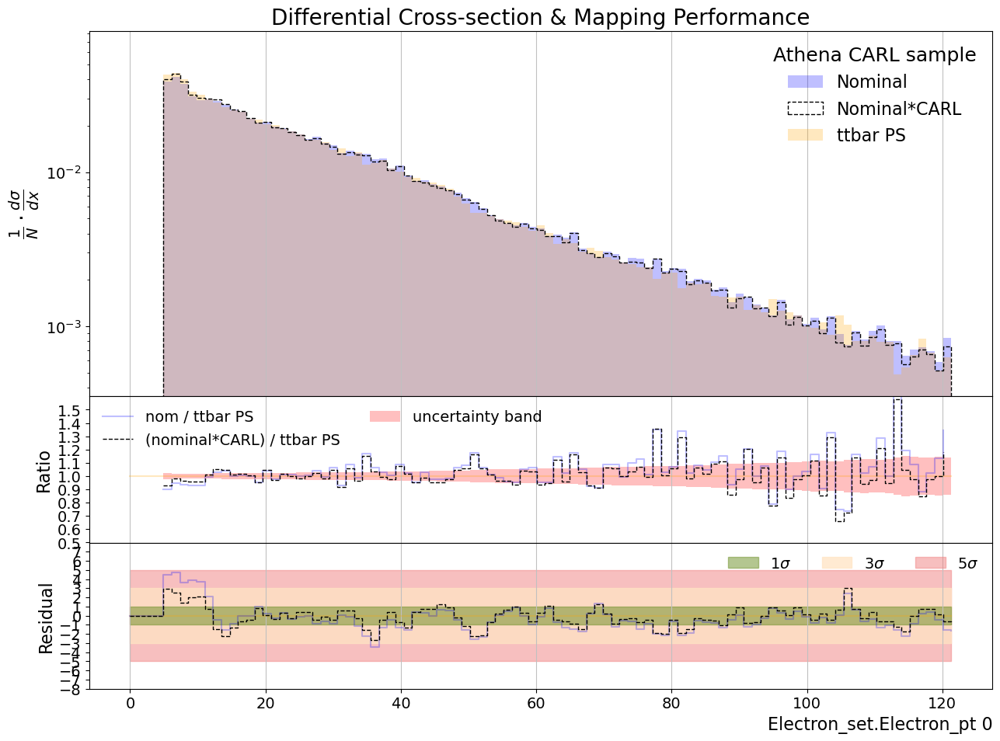

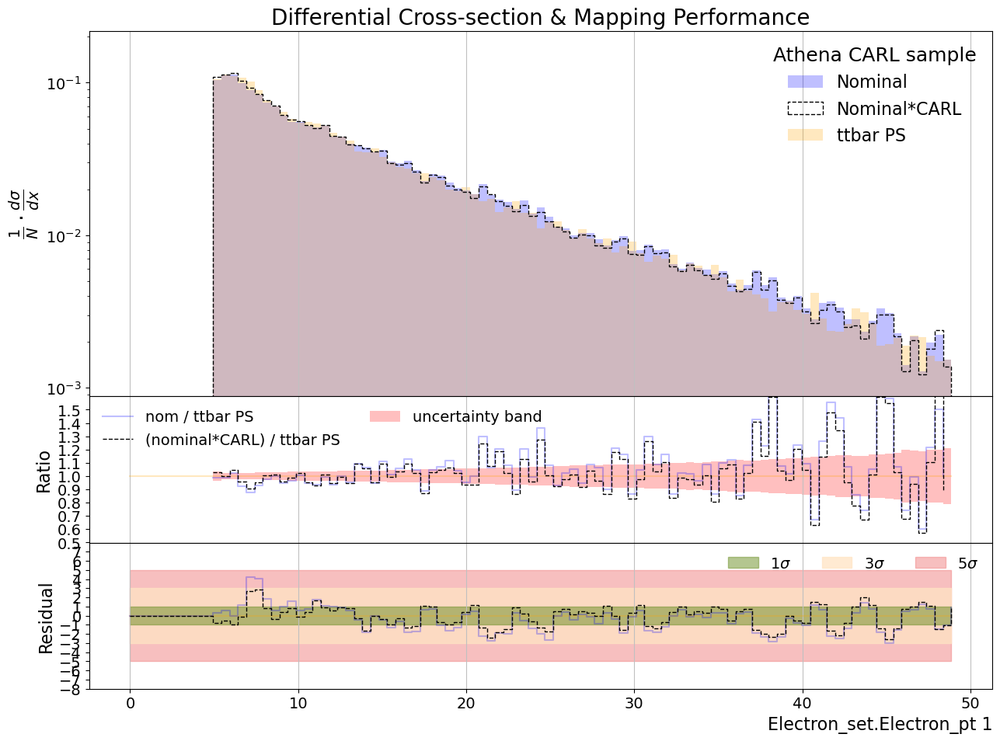

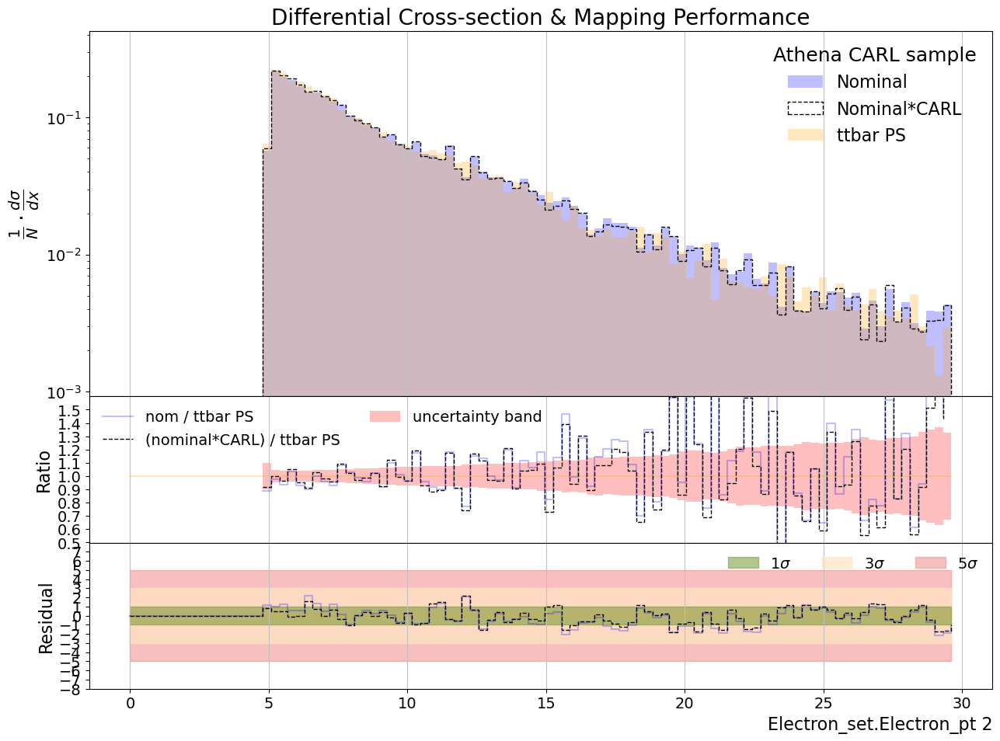

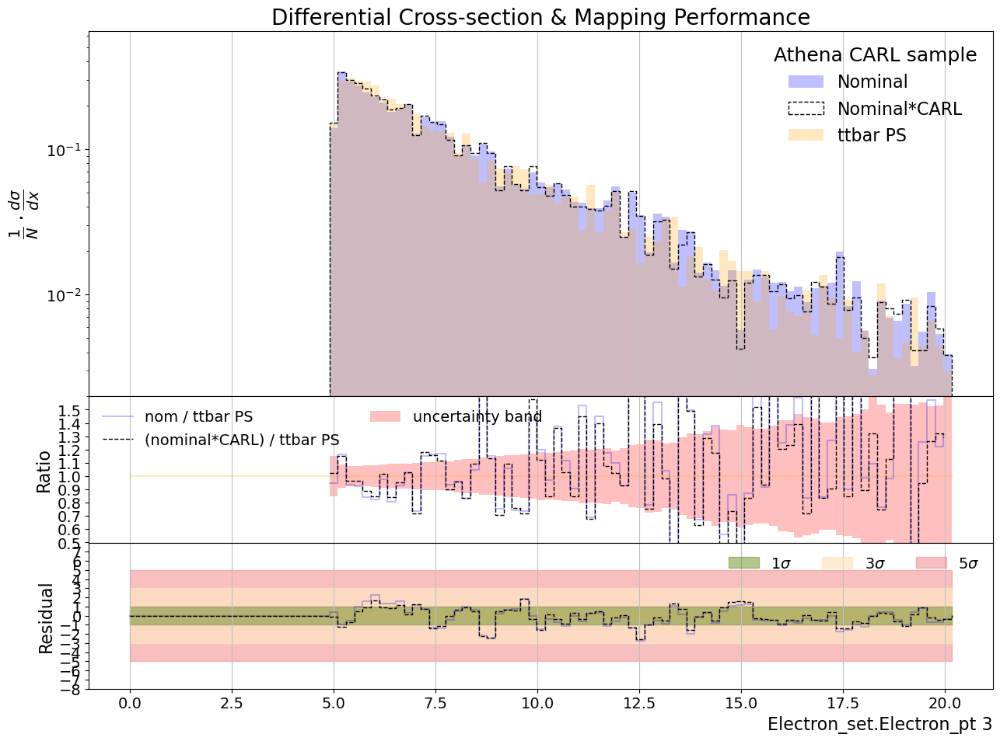

In [57]:
set_name = "Electron_set"
feature_name = "Electron_pt"

for i in range(4):
    carl_plot.plot_carl_reweighting(test_nominal_generator_data, test_PS_var_generator_data, r_hats, features,
                                    set_name, index=i, subfeature_name=feature_name, sort_feature="Electron_pt",
                                    alternate_name="ttbar PS", nominal_mask=np.isfinite, alternate_mask=np.isfinite, saveAs="plots/{}_{}{}.png".format(set_name, feature_name, i))

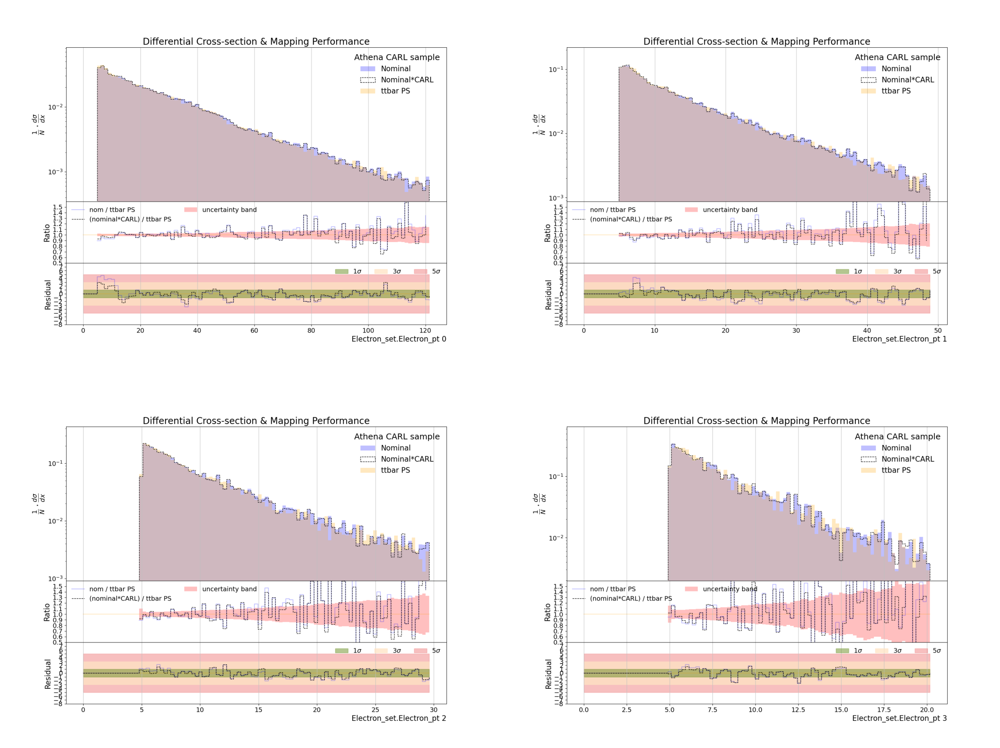

In [58]:
nrows = 2
ncolumns = 2

fig, axs = plt.subplots(nrows, ncolumns, figsize=(22,17))

set_name = "Electron_set"
feature_name = "Electron_pt"

for i in range(nrows):
    for j in range(ncolumns):
        im = plt.imread("plots/{}_{}{}.png".format(set_name, feature_name, i*ncolumns + j))
        axs[i,j].imshow(im)
        axs[i,j].axis('off')
fig.tight_layout()

100%|██████████| 782/782 [00:17<00:00, 43.52it/s]


71894
71845


100%|██████████| 782/782 [00:39<00:00, 19.81it/s]


34540
34354


100%|██████████| 782/782 [00:48<00:00, 16.01it/s]


11679
11856


100%|██████████| 782/782 [00:53<00:00, 14.65it/s]


3196
3076


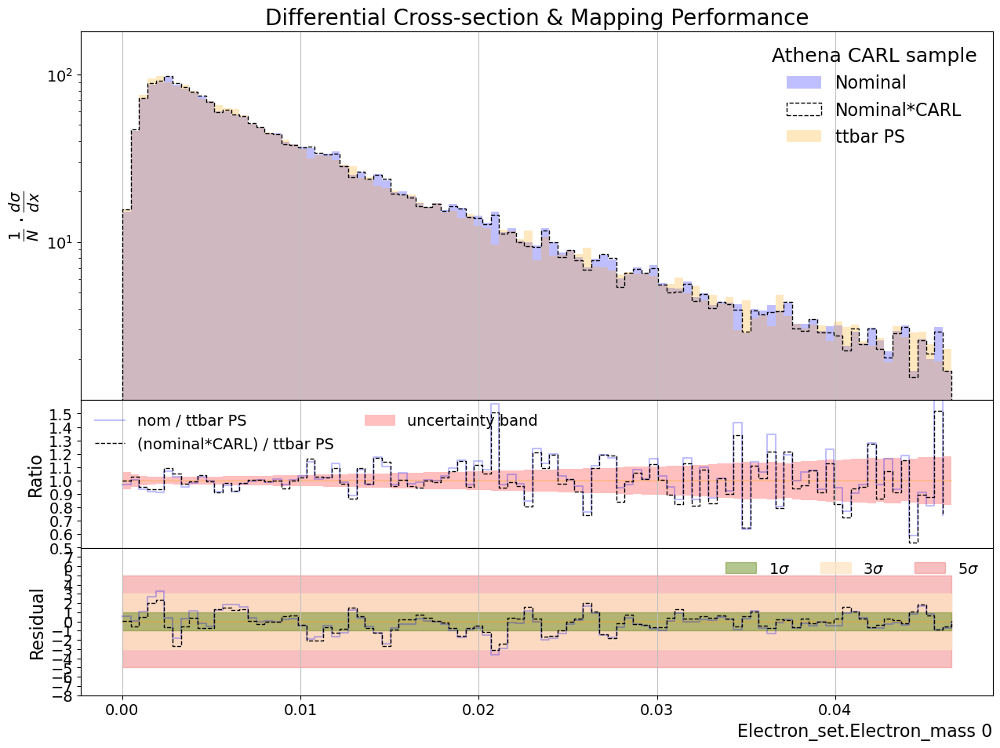

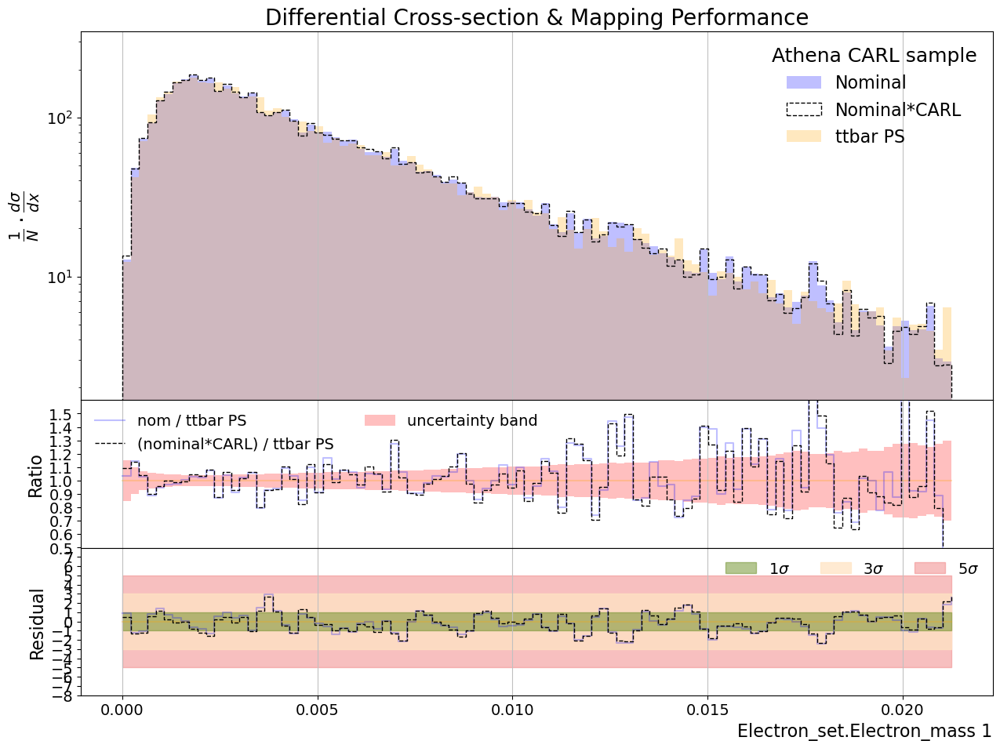

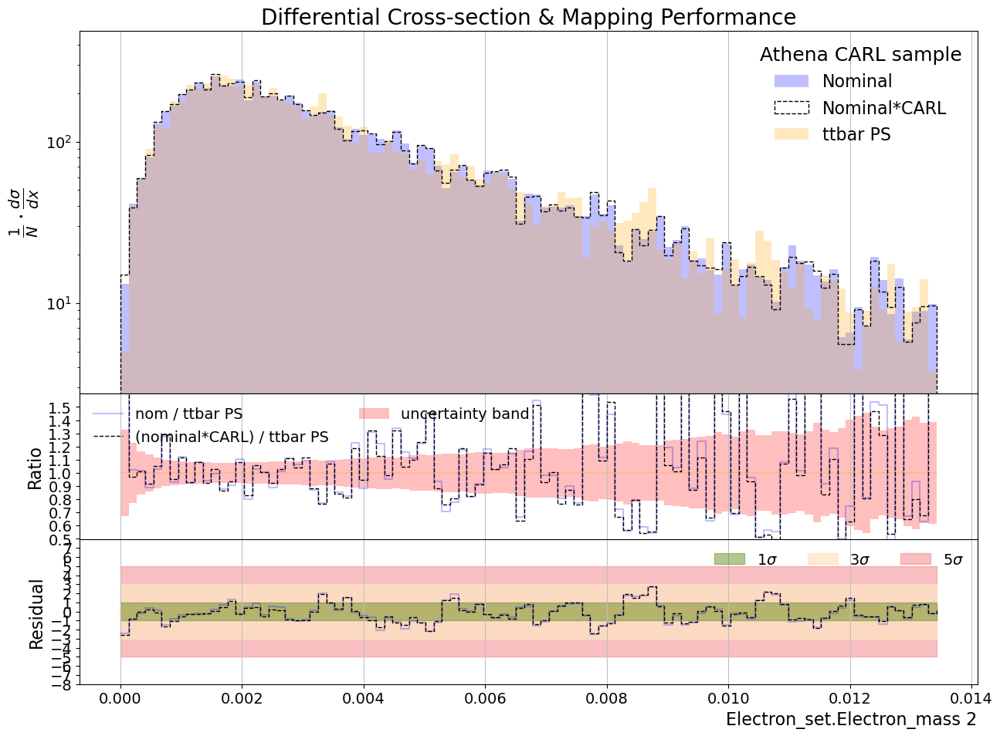

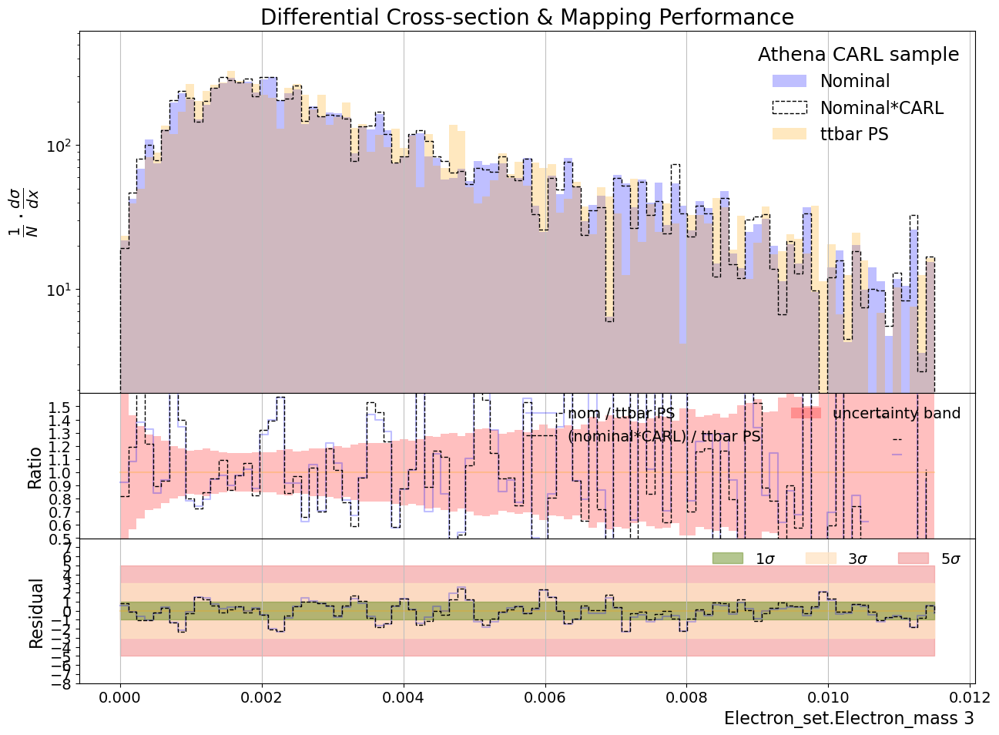

In [59]:
set_name = "Electron_set"
feature_name = "Electron_mass"

for i in range(4):
    carl_plot.plot_carl_reweighting(test_nominal_generator_data, test_PS_var_generator_data, r_hats, features,
                                    set_name, index=i, subfeature_name=feature_name, sort_feature="Electron_pt",
                                    alternate_name="ttbar PS", nominal_mask=np.isfinite, alternate_mask=np.isfinite, saveAs="plots/{}_{}{}.png".format(set_name, feature_name, i))

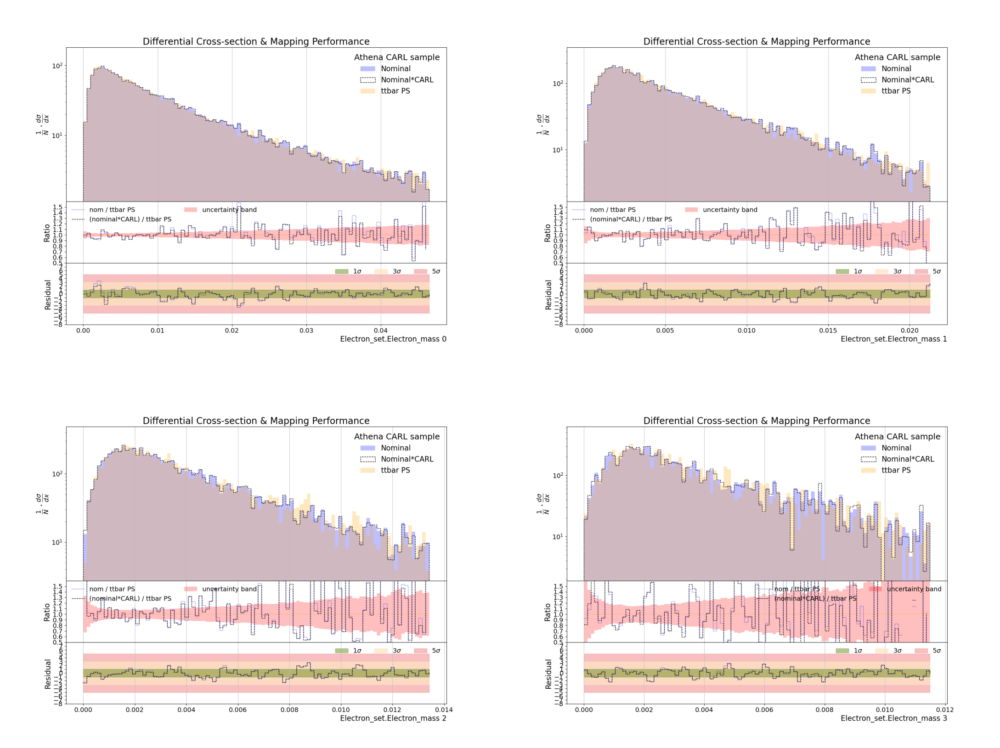

In [60]:
nrows = 2
ncolumns = 2

fig, axs = plt.subplots(nrows, ncolumns, figsize=(22,17))

set_name = "Electron_set"
feature_name = "Electron_mass"

for i in range(nrows):
    for j in range(ncolumns):
        im = plt.imread("plots/{}_{}{}.png".format(set_name, feature_name, i*ncolumns + j))
        axs[i,j].imshow(im)
        axs[i,j].axis('off')
fig.tight_layout()

### Plot MET

100%|██████████| 782/782 [00:01<00:00, 494.94it/s]


100000
100000


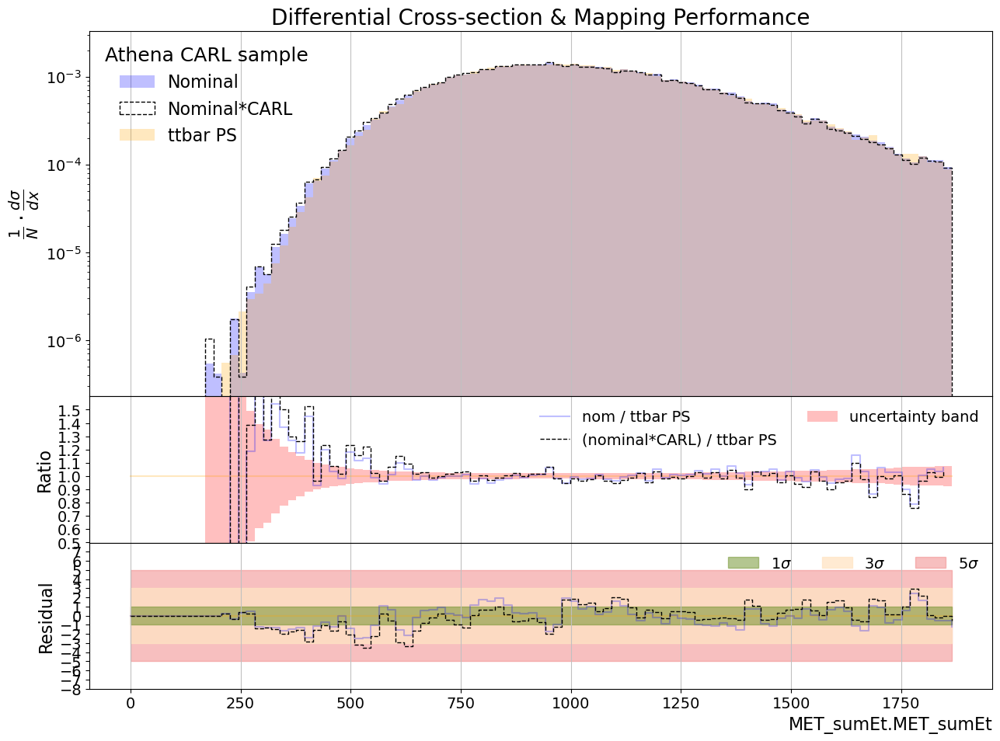

In [61]:
feature_name = "MET_sumEt"

carl_plot.plot_carl_reweighting(test_nominal_generator_data, test_PS_var_generator_data, r_hats, features,
                                feature_name, index=0,
                                alternate_name="ttbar PS", nominal_mask=np.isfinite, alternate_mask=np.isfinite, saveAs="plots/{}_{}{}.png".format(set_name, feature_name, i))

## Plot the reweighted distributions using the calibrated weights

In [ ]:
set_name = "Jet_set"
feature_name = "Jet_pt"

for i in range(8):
    carl_plot.plot_carl_reweighting(test_nominal_generator_data, test_PS_var_generator_data, calibrated_r_hats, features,
                                    set_name, index=i, subfeature_name=feature_name, sort_feature="Jet_pt",
                                    alternate_name="ttbar PS", nominal_mask=np.isfinite, alternate_mask=np.isfinite, saveAs="plots/{}_{}{}.png".format(set_name, feature_name, i))

## Calibration doesn't seem to help in this case